# Part 1: Graph Data Engineering, Spatial Network Analysis, and GNNs

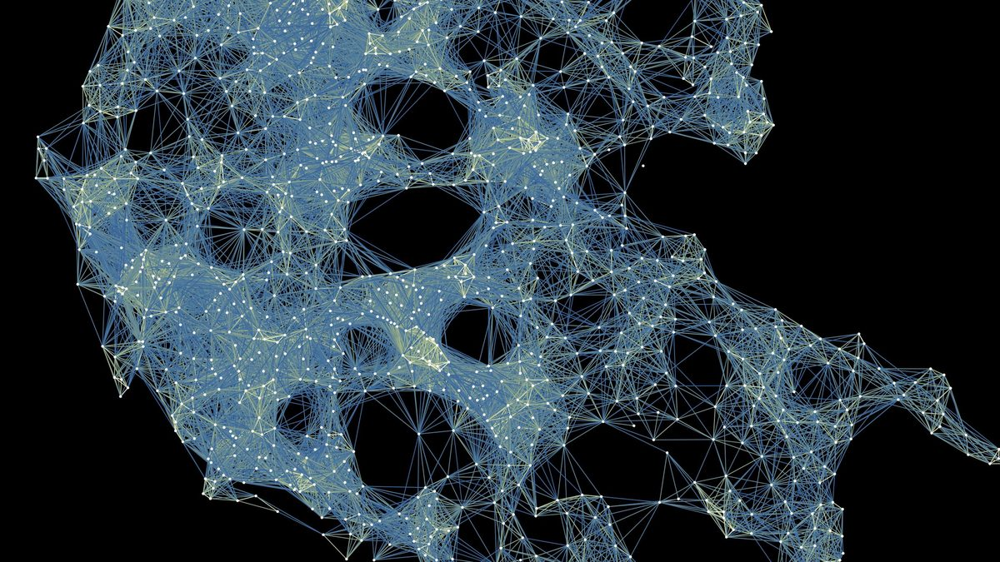

Reference: [*Sato et al. (2026)*](https://doi.org/10.1016/j.compenvurbsys.2026.102492)

Welcome to the workshop **GeoAI in Practice: From Geospatial Data to Graph Neural Networks with City2Graph**!



Part 1 covers the ideas behind (mostly) everything you will run in [Part 2](https://github.com/c2g-dev/city2graph-workshop/blob/main/notebooks/part2_geoai.ipynb), where you build a full GeoAI pipeline for a city of your choice.

By the end of Part 1, you will be able to:

- describe a network as nodes, edges, and an adjacency matrix
- imagine and identify graphs from spatial relations in cities, and construct them in Python
- quantify and analyse graphs to understand their property (e.g., importance of nodes in the system)
- explain how a GNN passes information along edges, and how a GeoDataFrame becomes a PyTorch Geometric tensor

Run the cells from top to bottom. Each demo is followed by a short reading of the result. If a cell that needs internet access fails at the venue, that text tells you what the output would have shown.

In [ ]:
# =========================================================
# Environment bootstrap.
# Safe to run anywhere: it only acts on Google Colab, and it
# is safe to run more than once.
# =========================================================
import os
import subprocess
import sys
from pathlib import Path

try:
    import google.colab

    IN_COLAB = True
except ImportError:
    IN_COLAB = False

if IN_COLAB:
    REPO_DIR = Path("/content/city2graph-workshop")

    # 1. Clone the workshop repository, unless a previous run already did
    if not REPO_DIR.exists():
        subprocess.run(
            [
                "git", "clone", "--depth", "1",
                "https://github.com/c2g-dev/city2graph-workshop.git",
                str(REPO_DIR),
            ],
            check=True,
        )

    # 2. Work from the repository root. An absolute path, so re-running never nests
    os.chdir(REPO_DIR)

    # 3. Install what Colab does not already ship. We deliberately do not ask for
    #    city2graph[cpu]: that extra pins a newer torch and, under pip, pulls the
    #    CUDA build from PyPI, replacing the perfectly good torch Colab gives you.
    subprocess.run(
        [
            sys.executable, "-m", "pip", "install", "-q",
            "city2graph==1.0.0",
            "torch-geometric",
            "osmnx",
            "contextily",
            "mapclassify",
            "folium",
        ],
        check=True,
    )

    print(f"Colab ready. Working directory: {Path.cwd()}")
else:
    print("Not on Colab: using the local environment created by `uv sync`.")


## Section 0. Environment check

Run the next cell. If it prints the library versions without raising an error, you are ready.

If it fails locally, work through the [Quickstart in the README](https://github.com/c2g-dev/city2graph-workshop#quickstart): `uv sync` installs everything this notebook needs.

On Google Colab, run the bootstrap cell above first. If the imports below still fail afterwards, the installer has upgraded a package that the kernel had already loaded: choose **Runtime > Restart session**, then run the bootstrap cell and this cell again.


In [2]:
import random
import sys
import urllib.request
from pathlib import Path

import contextily as ctx
import geopandas as gpd
import matplotlib.patheffects as pe
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import osmnx as ox
import pandas as pd
import seaborn as sns
import torch
import torch_geometric
import city2graph as c2g

from IPython.display import display
from matplotlib import colors as mcolors
from matplotlib.cm import ScalarMappable
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from shapely.geometry import Point

PROJECT_ROOT = Path.cwd()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent
DATA_DIR = PROJECT_ROOT / "data"
DATA_DIR.mkdir(exist_ok=True)

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

plt.rcParams["figure.figsize"] = (8, 8)
plt.rcParams["axes.titlesize"] = 14
plt.rcParams["axes.labelsize"] = 11
sns.set_theme(style="whitegrid")

DARK_BG = "#0f0f0f"
DARK_PANEL = "#161616"
DARK_EDGE = "#333333"
LIGHT_EDGE = "#ffffff"
ATTRIBUTION_COLOR = "#cccccc"
TEAL = "#2a9d8f"
ORANGE = "#e76f51"

def add_darkmatter_basemap(ax, crs):
    ctx.add_basemap(
        ax,
        crs=crs.to_string() if hasattr(crs, "to_string") else str(crs),
        source=ctx.providers.CartoDB.DarkMatter,
        alpha=1,
        attribution="",
    )

def style_dark_axes(ax, title=None):
    ax.set_facecolor(DARK_BG)
    if title is not None:
        ax.set_title(title, color="white")
    ax.set_axis_off()

print(f"Python           : {sys.version.split()[0]}")
print(f"city2graph       : {c2g.__version__}")
print(f"networkx         : {nx.__version__}")
print(f"osmnx            : {ox.__version__}")
print(f"geopandas        : {gpd.__version__}")
print(f"torch            : {torch.__version__}")
print(f"torch_geometric  : {torch_geometric.__version__}")

Python           : 3.13.5
city2graph       : 1.0.0
networkx         : 3.6.1
osmnx            : 2.1.0
geopandas        : 1.1.2
torch            : 2.10.0
torch_geometric  : 2.7.0


## Section 1. What is a graph?

A **graph**, or **network**, is a type of data structure expressing the relations between entities.

- **node** is an entity (e.g., an intersection, a shop, a bus stop, a district)
- **edge** is a relationship between two nodes (e.g., a street segment, a shared boundary, a tram line)

Edges could be:

- **directed** (e.g., a one-way street) or **undirected** (e.g., a footpath)
- **weighted** (e.g., length in metres, travel time in seconds, capacity)

The term *graph* is preferred in mathematics and computer science, while *network* is used in the network sciences, which span both the natural and the social sciences.

Let's see an example. We will use a famous dataset "Zachary karate club". To manipulate graph-based objects in Python, `networkx` is one of the most common libraries.

In [3]:
karate_G = nx.karate_club_graph()

You can see the number of nodes and edges.

In [4]:
print(f"Nodes (members)     : {karate_G.number_of_nodes()}")
print(f"Edges (friendships) : {karate_G.number_of_edges()}")

Nodes (members)     : 34
Edges (friendships) : 78


Or, you can check which nodes are the neighbours of one.

In [5]:
# The neighbours of a node are the nodes it shares an edge with
print(f"\nNeighbours of node 0: {sorted(karate_G.neighbors(0))}")

# This graph is weighted: every edge carries how often the two members interacted
print(f"Edge (0, 1)         : {karate_G.edges[0, 1]}")


Neighbours of node 0: [1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 17, 19, 21, 31]
Edge (0, 1)         : {'weight': 4}


Now it's time to visualise it!

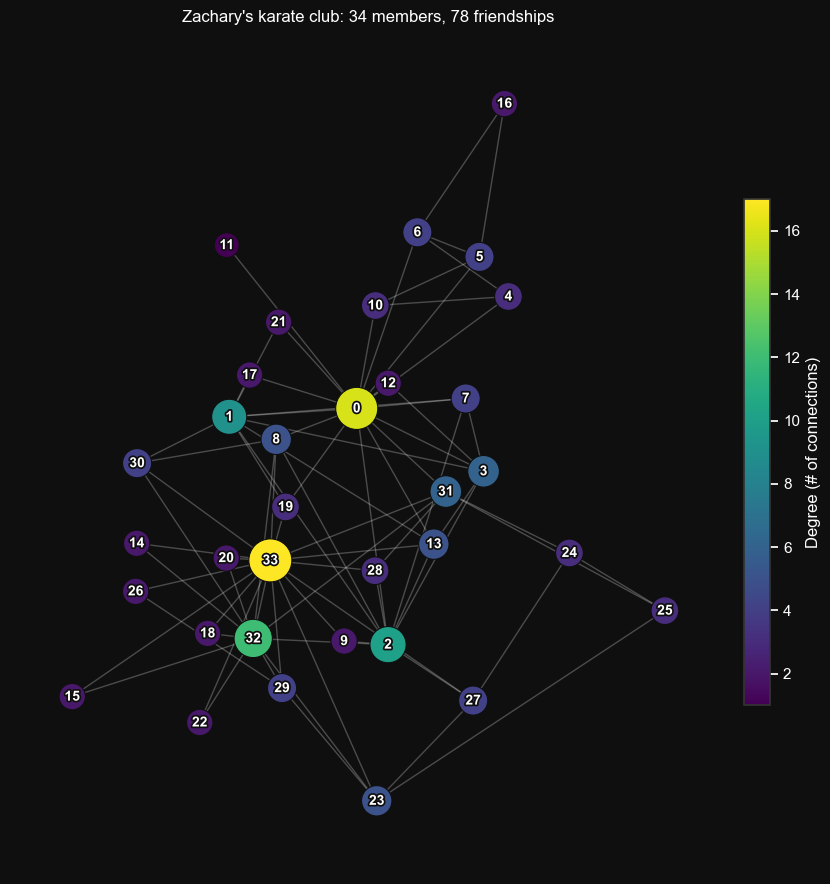

In [6]:
# A graph has no coordinates of its own, so we ask networkx to invent a layout:
# kamada_kawai_layout places the nodes so that the distances you see on screen
# approximate the number of hops between them.
KARATE_POS = nx.kamada_kawai_layout(karate_G)

# The degree of a node is how many edges meet at it
degree = dict(karate_G.degree())

fig, ax = plt.subplots(figsize=(9, 9), facecolor=DARK_BG)
ax.set_facecolor(DARK_BG)

nx.draw_networkx_edges(karate_G, KARATE_POS, ax=ax, edge_color=LIGHT_EDGE, width=1.0, alpha=0.25)
drawn_nodes = nx.draw_networkx_nodes(
    karate_G,
    KARATE_POS,
    ax=ax,
    node_size=[280 + 40 * degree[node] for node in karate_G.nodes],  # size by degree
    node_color=[degree[node] for node in karate_G.nodes],            # colour by degree
    cmap="viridis",
    linewidths=0.8,
    edgecolors=DARK_BG,
)

# Bold labels with a dark outline, so the number stays readable on a bright node too
node_labels = nx.draw_networkx_labels(
    karate_G, KARATE_POS, ax=ax, font_size=10, font_color="white", font_weight="bold"
)
for text in node_labels.values():
    text.set_path_effects([pe.withStroke(linewidth=2.5, foreground=DARK_BG)])

cbar = fig.colorbar(drawn_nodes, ax=ax, shrink=0.6, pad=0.02)
cbar.set_label("Degree (# of connections)", color="white")
cbar.ax.tick_params(colors="white")
cbar.outline.set_edgecolor(DARK_EDGE)

style_dark_axes(
    ax,
    f"Zachary's karate club: {karate_G.number_of_nodes()} members, "
    f"{karate_G.number_of_edges()} friendships",
)

plt.tight_layout()
plt.show()

The same graph can be written as an $n \times n$ **adjacency matrix** $\mathbf{A}$, where $\mathbf{A}_{ij}$ is 1 when node $i$ and node $j$ share an edge, and 0 when they do not.

In [7]:
# weight=None ignores the interaction counts, so every cell is simply 1 (edge) or 0 (no edge)
A = nx.to_numpy_array(karate_G, weight=None)

In [8]:
A

array([[0., 1., 1., ..., 1., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [1., 1., 0., ..., 0., 1., 0.],
       ...,
       [1., 0., 0., ..., 0., 1., 1.],
       [0., 0., 1., ..., 1., 0., 1.],
       [0., 0., 0., ..., 1., 1., 0.]], shape=(34, 34))

In [9]:
print(f"Shape                 : {A.shape}")
print(f"Symmetric (undirected): {np.array_equal(A, A.T)}")
print(f"Values                : {np.unique(A)}")
print(f"Non-zero entries      : {int(A.sum())} = 2 x {karate_G.number_of_edges()} edges")

Shape                 : (34, 34)
Symmetric (undirected): True
Values                : [0. 1.]
Non-zero entries      : 156 = 2 x 78 edges


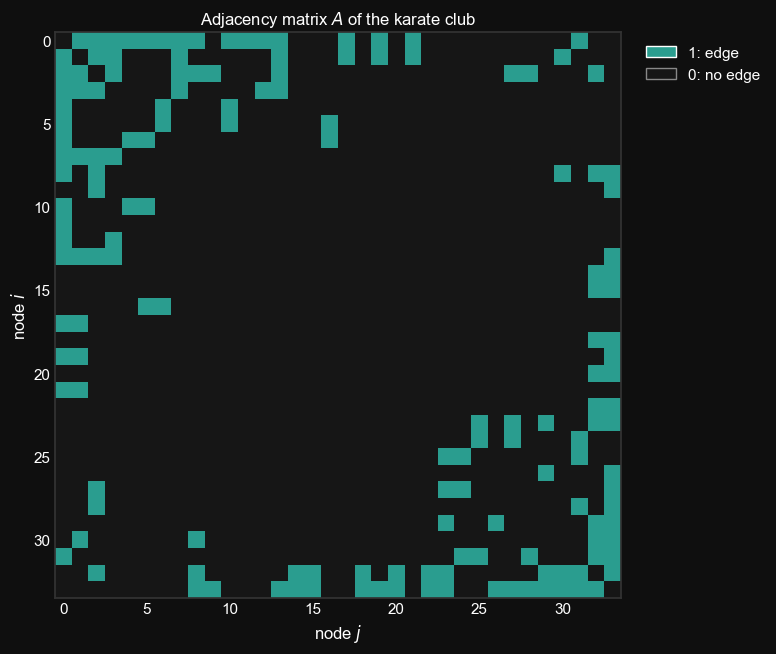

In [10]:
# Two colours only: one for the cells that hold an edge, one for the cells that do not
binary_cmap = mcolors.ListedColormap([DARK_PANEL, TEAL])

fig, ax = plt.subplots(figsize=(7.5, 7), facecolor=DARK_BG)
ax.set_facecolor(DARK_BG)
ax.grid(False)

ax.imshow(A, cmap=binary_cmap, vmin=0, vmax=1, interpolation="nearest")

ax.set_xticks(range(0, len(A), 5))
ax.set_yticks(range(0, len(A), 5))
ax.tick_params(colors="white", length=0)
for spine in ax.spines.values():
    spine.set_color(DARK_EDGE)
ax.set_xlabel("node $j$", color="white")
ax.set_ylabel("node $i$", color="white")
ax.set_title("Adjacency matrix $A$ of the karate club", color="white")
ax.legend(
    handles=[
        Patch(facecolor=TEAL, label="1: edge"),
        Patch(facecolor=DARK_PANEL, edgecolor="#888888", label="0: no edge"),
    ],
    loc="upper left",
    bbox_to_anchor=(1.02, 1.0),
    frameon=False,
    labelcolor="white",
)

plt.tight_layout()
plt.show()

The karate club graph is weighted: every edge records how often those two members interacted outside the club. If you keep those counts instead of flattening them to 1, the same matrix carries them as its values.

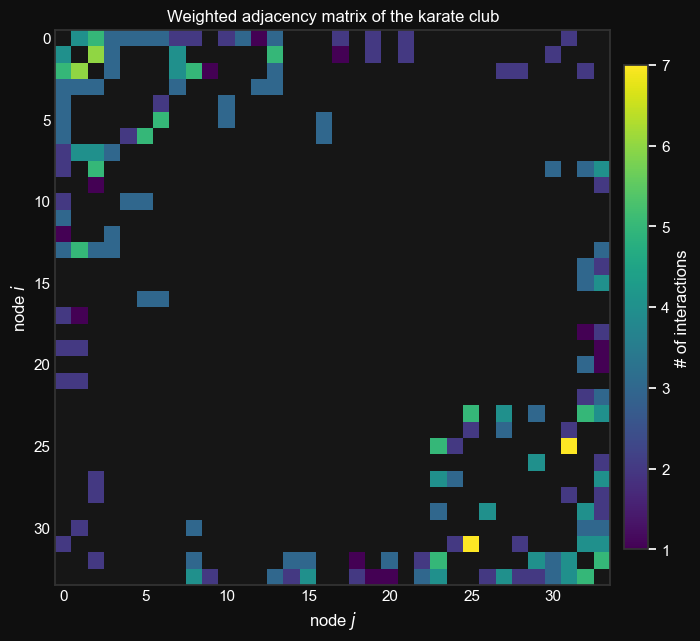

In [11]:
# The same matrix, but keeping the edge weights, and leaving the zeros as background
A_weighted = nx.to_numpy_array(karate_G)

weighted_cmap = plt.get_cmap("viridis").copy()
weighted_cmap.set_bad(DARK_PANEL)

fig, ax = plt.subplots(figsize=(7.5, 7), facecolor=DARK_BG)
ax.set_facecolor(DARK_BG)
ax.grid(False)

im = ax.imshow(
    np.ma.masked_where(A_weighted == 0, A_weighted), cmap=weighted_cmap, interpolation="nearest"
)

ax.set_xticks(range(0, len(A_weighted), 5))
ax.set_yticks(range(0, len(A_weighted), 5))
ax.tick_params(colors="white", length=0)
for spine in ax.spines.values():
    spine.set_color(DARK_EDGE)
ax.set_xlabel("node $j$", color="white")
ax.set_ylabel("node $i$", color="white")
ax.set_title("Weighted adjacency matrix of the karate club", color="white")

cbar = fig.colorbar(im, ax=ax, shrink=0.75, pad=0.02)
cbar.set_label("# of interactions", color="white")
cbar.ax.tick_params(colors="white")
cbar.outline.set_edgecolor(DARK_EDGE)

plt.tight_layout()
plt.show()

Two things are worth reading off this matrix.

It is **symmetric**: $\mathbf{A}_{ij} = \mathbf{A}_{ji}$, because a friendship runs both ways. A directed graph,
such as a one-way street network, would not be.

It is **sparse**: only 156 of the $34 \times 34 = 1156$ cells hold an edge. Real networks are almost
always sparse, which is why we store them as lists of edges rather than as full matrices. Notice also
the two dense blocks, one in the top-left corner and one in the bottom-right: the members cluster
into two groups that mix far more inside the group than across it.

## Section 2. Analysing a graph

Okay, we now know what graphs are.

The next question is how we can understand the properties of a graph, in the way that exploratory data analysis tells us about a table.

Let's get familiar with network analysis through a real case. To begin, we will look at the most tangible graph on a map: the street network.

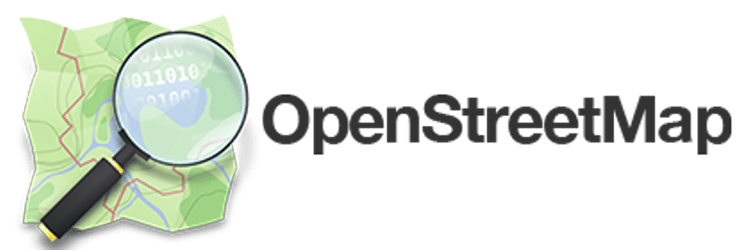

Reference: https://www.openstreetmap.org/

If you know GIS, what does the word ‘street’ bring to mind for you? ... Yes, OpenStreetMap!

If you deal with streets from OSM as a graph in Python, the best approach is to use `osmnx`. It can fetch and process OpenStreetMap data in a few lines of code.

`ox.graph_from_point()` downloads the walkable network around a point from OpenStreetMap, and `c2g.nx_to_gdf()` converts it into node and edge GeoDataFrames, so you can map and join it like any other geospatial layer.

- Nodes are street intersections and dead ends.
- Edges are the street segments between them.
- Every edge carries a `length` in metres, so this is a weighted graph of the same kind as the six-landmark one above.

In [12]:
# 1000 m from the International Conference Center Hiroshima, the FOSS4G 2026 venue (lat, lng)
CENTER_NAME = "International Conference Center Hiroshima"
CENTER_POINT = (34.392083, 132.451028)
DIST_M = 1000

# Create a street network graph from OSM data
G_street = ox.graph_from_point(CENTER_POINT, dist=DIST_M, network_type="walk")

# Convert the street network graph to GeoDataFrames
street_nodes, street_edges = c2g.nx_to_gdf(G_street)

# Obtain the UTM zone for the street network and project the GeoDataFrames to that CRS
EPSG = street_nodes.estimate_utm_crs().to_epsg()
street_nodes = street_nodes.to_crs(epsg=EPSG)
street_edges = street_edges.to_crs(epsg=EPSG)

print(f"Street network: {len(street_nodes)} intersections, {len(street_edges)} segments")
print(f"Projected CRS : EPSG:{EPSG}")

Street network: 3441 intersections, 11052 segments
Projected CRS : EPSG:32653


In [13]:
street_nodes.head()

,y,x,highway,street_count,geometry,ref,railway
191589453,34.394445,132.461281,traffic_signals,4,POINT (266616.176 3808814.564),NaN,NaN
191589466,34.395391,132.457605,traffic_signals,4,POINT (266280.765 3808927.961),NaN,NaN
191589475,34.395971,132.455087,traffic_signals,3,POINT (266050.85 3808998.141),NaN,NaN
191589502,34.396706,132.451898,NaN,1,POINT (265759.652 3809087.05),NaN,NaN
191589609,34.392788,132.442793,traffic_signals,4,POINT (264911.523 3808673.528),NaN,NaN


In [14]:
street_edges.head()

osmid    highway lanes maxspeed   name  oneway  \
191589453 1456572105 0    24622415  secondary     3       50  広島海田線   False   
          1456572111 0    24622415  secondary     3       50  広島海田線   False   
          1388356210 0    24818468   tertiary     2      NaN    NaN   False   
          267639817  0  1152905776   tertiary     2      NaN    NaN   False   
191589466 1395938433 0    28185604      trunk     3       50   相生通り   False   

                            ref reversed      length  \
191589453 1456572105 0      164    False   13.474899   
          1456572111 0      164     True   11.457543   
          1388356210 0      NaN    False   11.381198   
          267639817  0      NaN    False   17.156675   
191589466 1395938433 0  183;261     True  100.627234   

                                                                 geometry  \
191589453 1456572105 0  LINESTRING (266616.176 3808814.564, 266629.057...   
          1456572111 0  LINESTRING (266616.176 3808814.564, 266605.221...   
          1388356210 0  LINESTRING (266616.176 3808814.564, 266619.43 ...   
          267639817  0  LINESTRING (266616.176 3808814.564, 266614.544...   
191589466 1395938433 0  LINESTRING (266280.765 3808927.961, 266184.315...   

                       bridge width access service tunnel junction  
191589453 1456572105 0    NaN   NaN    NaN     NaN    NaN      NaN  
          1456572111 0    NaN   NaN    NaN     NaN    NaN      NaN  
          1388356210 0    NaN   NaN    NaN     NaN    NaN      NaN  
          267639817  0    NaN   NaN    NaN     NaN    NaN      NaN  
191589466 1395938433 0    NaN   NaN    NaN     NaN    NaN      NaN

Let's see how it looks like:

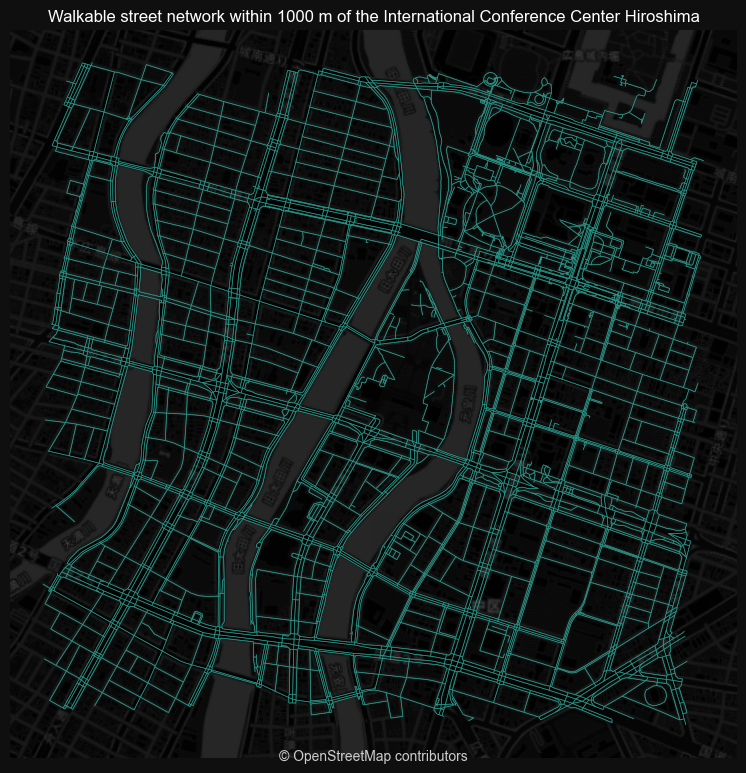

In [15]:
fig, ax = plt.subplots(figsize=(8, 8), facecolor=DARK_BG)
street_edges.plot(ax=ax, color=TEAL, linewidth=0.5, alpha=0.8)
add_darkmatter_basemap(ax, street_edges.crs)
style_dark_axes(ax, f"Walkable street network within {DIST_M} m of the {CENTER_NAME}")
fig.text(0.5, 0.02, "© OpenStreetMap contributors", ha="center", fontsize=10, color=ATTRIBUTION_COLOR)
plt.tight_layout()
plt.show()

### Centrality: which nodes matter most?


Centrality scores rank nodes by their position in the network. They use nothing but the edges: no coordinates, no land use, no traffic counts.

- **Degree centrality** is the number of edges meeting at a node, so it counts how many streets reach that intersection.
- **Closeness centrality** is built from the mean network distance between a node and every other node. A node with high closeness reaches the rest of the area quickly on foot.
- **Betweenness centrality** is the share of all shortest paths that run through a node. A node with high betweenness carries movement between other places.

Closeness and betweenness both use `length` as the edge weight, so they measure metres of walking rather than numbers of turns.

Two things happen in the next cell that are worth knowing about. `nx.Graph(G_street)` discards one-way restrictions and parallel edges, which is acceptable for a walking network but would not be for driving. And exact betweenness needs a shortest-path search from every node, so we sample 800 origins instead: the spatial pattern is the same and the wait is far shorter.

The cell takes 20 to 30 seconds.

In [16]:
G_simple = nx.Graph(G_street)  # collapse parallel edges; centrality needs a simple graph

degree_dict = dict(G_simple.degree())
closeness_dict = nx.closeness_centrality(G_simple, distance="length")
betweenness_dict = nx.betweenness_centrality(
    G_simple, weight="length", k=min(800, len(G_simple)), seed=SEED
)

street_nodes["degree"] = street_nodes.index.map(degree_dict)
street_nodes["closeness"] = street_nodes.index.map(closeness_dict)
street_nodes["betweenness"] = street_nodes.index.map(betweenness_dict)

street_nodes[["degree", "closeness", "betweenness"]].describe().round(4)

,degree,closeness,betweenness
count,3441.0000,3441.0000,3441.0000
mean,3.1938,0.0008,0.0108
std,0.8101,0.0001,0.0157
min,1.0000,0.0005,0.0000
25%,3.0000,0.0007,0.0014
50%,3.0000,0.0008,0.0051
75%,4.0000,0.0009,0.0132
max,8.0000,0.0011,0.1497


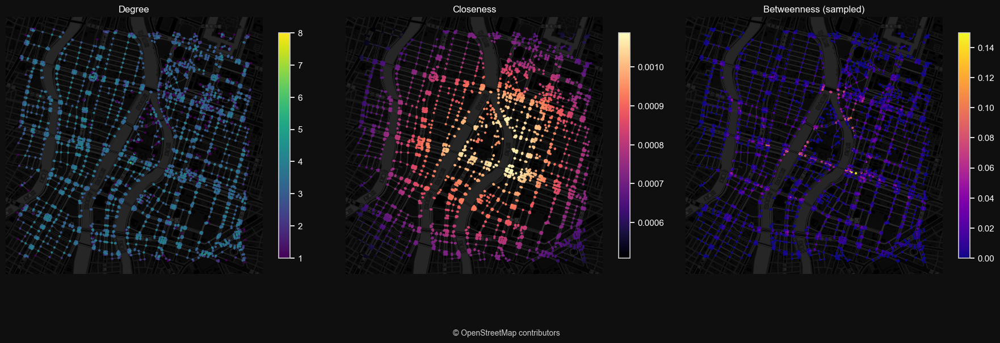

In [17]:
centrality_specs = [
    ("degree", "viridis", "Degree"),
    ("closeness", "magma", "Closeness"),
    ("betweenness", "plasma", "Betweenness (sampled)"),
]

fig, axes = plt.subplots(1, 3, figsize=(18, 7), facecolor=DARK_BG)
for ax, (column, cmap, title) in zip(axes, centrality_specs):
    ax.set_facecolor(DARK_BG)
    street_edges.plot(ax=ax, color=DARK_EDGE, linewidth=0.4, alpha=0.8, zorder=1)
    street_nodes.plot(
        ax=ax, column=column, cmap=cmap, markersize=4, alpha=0.9, zorder=2, legend=True,
        legend_kwds={"shrink": 0.6},
    )
    add_darkmatter_basemap(ax, street_nodes.crs)
    style_dark_axes(ax, title)
    cbar_ax = fig.axes[-1]
    cbar_ax.tick_params(colors="white")

fig.text(0.5, 0.02, "© OpenStreetMap contributors", ha="center", fontsize=10, color=ATTRIBUTION_COLOR)
plt.tight_layout()
plt.show()

### What could you see?

- How would you describe the distribution of each centrality? Why do you think it looks that way?
- Where could this centrality method be applied in a real analytical task?

### Choose your own city, on Overture Maps

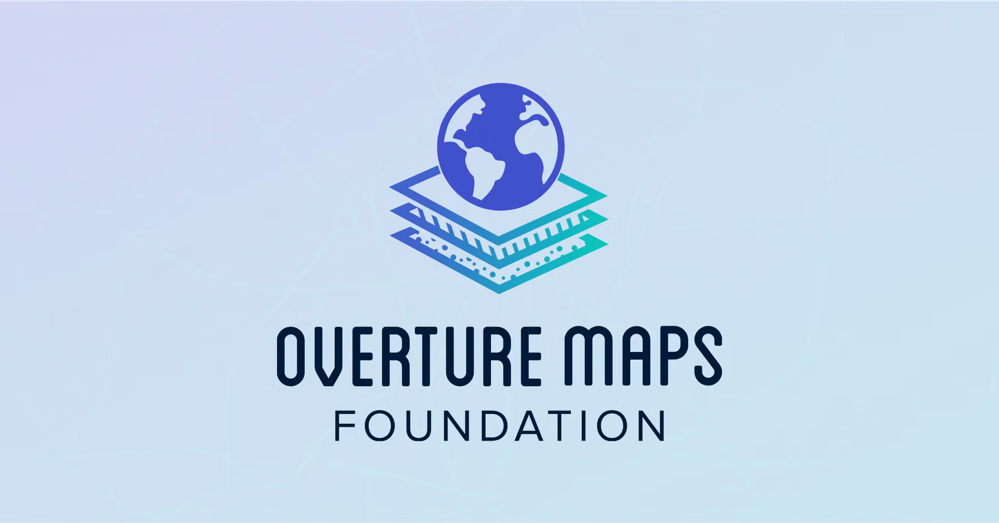

Reference: Overture Maps Foundation (https://overturemaps.org/)

Your turn!

Let's apply the same analysis to a place you know, this time from [Overture Maps](https://overturemaps.org/).

Overture Maps is an open map dataset governed by contributors such as Amazon, Meta, Microsoft and TomTom. OpenStreetMap is one of its inputs, but Overture republishes it under a single global schema, so `segment`, `connector`, `place`, `building` and `land_use` mean the same thing in Osaka as in Nairobi.

`c2g.load_overture_data()` accepts a place name and geocodes it with Nominatim, just as `ox.graph_from_place()` does.

Notice: the Overture Maps API provides raw `LineString` geometries, so we need to take four steps:

1. `c2g.load_overture_data(place_name=...)` downloads segments and connectors for the place
2. `c2g.process_overture_segments()` splits each segment at its connectors and snaps nearby endpoints together
3. `c2g.segments_to_graph()` turns the split segments into node and edge GeoDataFrames
4. `c2g.gdf_to_nx()` produces the NetworkX graph the centrality functions expect

If you are interested in this workflow in detail, please read [How to use Overture Maps like OSMnx by city2graph](https://medium.com/@yuta.sato.now/how-to-use-overture-maps-like-osmnx-by-city2graph-7e01d38f9f61).

In [18]:
# <- change these two lines to a place you know
MY_PLACE = "Shibuya, Tokyo, Japan"
MY_DIST_M = 1000  # the same 1 km radius as the Hiroshima example above

In [19]:
# 1. Download the raw street geometries for your place (this takes 30 s or so)
my_data = c2g.load_overture_data(
    place_name=MY_PLACE,
    types=["segment", "connector"],
    save_to_file=False,
)

# Project to a local metric CRS, so that every length below is in metres
MY_EPSG = my_data["segment"].estimate_utm_crs().to_epsg()
my_data = {name: gdf.to_crs(epsg=MY_EPSG) for name, gdf in my_data.items()}

# Overture segments also cover railways and ferry routes, so keep the roads
my_roads = my_data["segment"][my_data["segment"]["subtype"] == "road"]

# 2. Split every segment at its connectors, and snap nearby endpoints together
my_segments = c2g.process_overture_segments(
    my_roads,
    connectors_gdf=my_data["connector"],
    get_barriers=False,
)

# 3. Turn the split segments into node and edge GeoDataFrames
my_nodes, my_edges = c2g.segments_to_graph(my_segments)
my_edges["length"] = my_edges.geometry.length  # metres, our edge weight

# 4. Build the NetworkX graph that the centrality functions expect
my_G = c2g.gdf_to_nx(my_nodes, my_edges)

print(f"Whole of {MY_PLACE}: {my_G.number_of_nodes()} nodes, {my_G.number_of_edges()} edges")

Removed 49 invalid geometries


Whole of Shibuya, Tokyo, Japan: 13053 nodes, 17552 edges


In [20]:
# A whole ward or borough is more than we need, and betweenness gets slow quickly.
# Keep only what lies within MY_DIST_M of the centre, measured along the streets
# rather than as the crow flies.
my_centre = my_nodes.union_all().centroid
my_G = c2g.filter_graph_by_distance(my_G, my_centre, threshold=MY_DIST_M, edge_attr="length")

print(f"Within {MY_DIST_M} m of the centre: "
      f"{my_G.number_of_nodes()} nodes, {my_G.number_of_edges()} edges")

Within 1000 m of the centre: 1462 nodes, 2087 edges


In [21]:
# The same three centralities as before, weighted by metres of walking
nx.set_node_attributes(my_G, dict(my_G.degree()), "degree")
nx.set_node_attributes(
    my_G, nx.closeness_centrality(my_G, distance="length"), "closeness"
)
nx.set_node_attributes(
    my_G,
    nx.betweenness_centrality(my_G, weight="length", k=min(800, len(my_G)), seed=SEED),
    "betweenness",
)

# c2g.gdf_to_nx() renumbers the nodes, so read the scores back out of the graph
# with c2g.nx_to_gdf() rather than joining them onto the old GeoDataFrames by index.
my_nodes, my_edges = c2g.nx_to_gdf(my_G)

my_nodes[["degree", "closeness", "betweenness"]].describe().round(4)

,degree,closeness,betweenness
count,1462.0000,1462.0000,1462.0000
mean,2.8550,0.0011,0.0178
std,0.9503,0.0002,0.0233
min,1.0000,0.0008,0.0000
25%,2.0000,0.0010,0.0019
50%,3.0000,0.0011,0.0088
75%,3.0000,0.0013,0.0258
max,8.0000,0.0015,0.1474


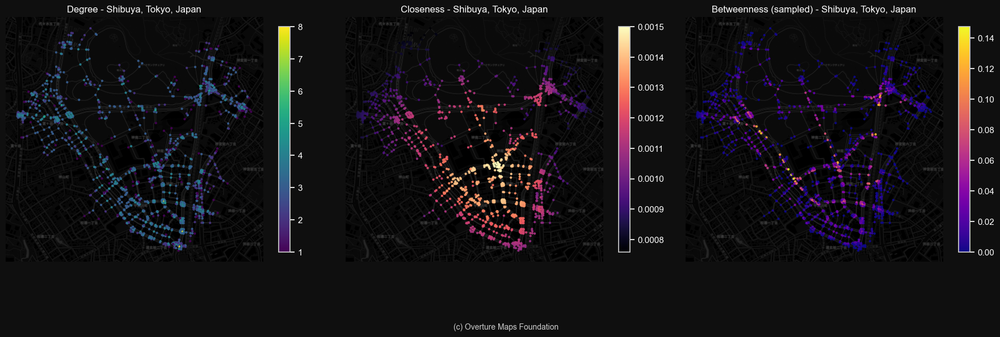

In [22]:
fig, axes = plt.subplots(1, 3, figsize=(18, 7), facecolor=DARK_BG)
for ax, (column, cmap, title) in zip(axes, centrality_specs):
    ax.set_facecolor(DARK_BG)
    my_edges.plot(ax=ax, color=DARK_EDGE, linewidth=0.4, alpha=0.8, zorder=1)
    my_nodes.plot(
        ax=ax, column=column, cmap=cmap, markersize=4, alpha=0.9, zorder=2, legend=True,
        legend_kwds={"shrink": 0.6},
    )
    add_darkmatter_basemap(ax, my_nodes.crs)
    style_dark_axes(ax, f"{title} - {MY_PLACE}")
    cbar_ax = fig.axes[-1]
    cbar_ax.tick_params(colors="white")

fig.text(0.5, 0.02, "(c) Overture Maps Foundation", ha="center", fontsize=10, color=ATTRIBUTION_COLOR)
plt.tight_layout()
plt.show()

### What could you see?

- Does the pattern of centralities look like the Hiroshima one, or is your city built differently?
- The four steps above were needed because Overture ships raw `LineString` geometries under one
  global schema, whereas OSMnx hands you a finished graph. What do you gain in return?

## Section 3. More graphs in cities

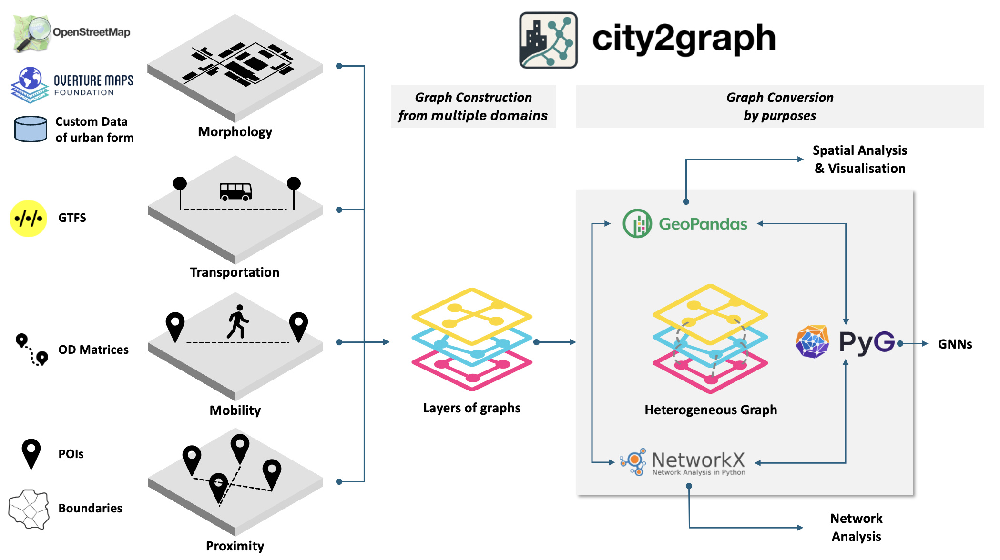

So far we have worked with the street network.

In cities we can observe many more spatial relations that can be seen as graphs.

With `city2graph` you can construct graphs from multiple data domains. We will work through some of those examples.

### 3.1 Beyond streets, with public transports

Walking is not the only way to move through a city. Residents use several modes of transport.

If you use the timetable of such public transport, you can construct a graph with:

- **node**: a stop
- **edge**: two stops that are consecutive on some trip
- **weight**: the scheduled time between them, in seconds

There is an open standard for it called **GTFS** (General Transit Feed Specification). A GTFS feed is a zip of CSV files: `stops.txt`, `routes.txt`, `trips.txt`, `stop_times.txt`, and so on. It is published by transit agencies worldwide.

We will use the feed for **Hiroden buses** (広島電鉄), published by the Hiroshima Bus Association at [https://www.bus-kyo.or.jp/gtfs-open-data](https://www.bus-kyo.or.jp/gtfs-open-data).

A note on what this feed is and is not. 広島電鉄 runs both the famous Hiroshima trams and an extensive bus network, but the feed published here covers the **bus** division only: all 166 of its routes carry `route_type=3` (bus), and no tram routes appear. So the demonstration below is walking plus buses. The tram would slot into exactly the same structure if a feed for it were published.

You can construct graphs from GTFS with `city2graph`.

Firstly, `c2g.load_gtfs()` reads the zip into an in-memory DuckDB database, one table per `.txt` file, and hands back the connection. The timetable stays in the database rather than in pandas, which is why a feed carrying a quarter of a million rows of `stop_times` loads in about a second. If you want to look inside, plain SQL will do it.

`c2g.travel_summary_graph()` then collapses the timetable into a graph. For a time window you choose, it works out every consecutive stop pair that is actually served, and returns node and edge GeoDataFrames where each edge carries:

- `travel_time_sec`, the service-weighted mean scheduled time between the two stops
- `frequency`, how many scheduled traversals ran in that window

In [23]:
GTFS_URL = "https://ajt-mobusta-gtfs.mcapps.jp/static/8/current_data.zip"
GTFS_PATH = DATA_DIR / "hiroden_bus_gtfs.zip"

if not GTFS_PATH.exists():
    print("Downloading the Hiroden GTFS feed (about 12 MB)...")
    urllib.request.urlretrieve(GTFS_URL, GTFS_PATH)

# load_gtfs() hands back a DuckDB connection, so the timetable stays in the database
con = c2g.load_gtfs(GTFS_PATH)

stop_times_rows = con.execute("SELECT COUNT(*) FROM stop_times").fetchone()[0]
print(f"stop_times holds {stop_times_rows:,} rows")

stop_times holds 257,948 rows


In [24]:
stop_nodes, stop_edges = c2g.travel_summary_graph(
    con,
    start_time="08:00:00",
    end_time="09:00:00",
    calendar_start="20260831",
    calendar_end="20260831",
)
stop_nodes = stop_nodes.to_crs(epsg=EPSG)
stop_edges = stop_edges.to_crs(epsg=EPSG)

print(f"Bus network: {len(stop_nodes)} stops, {len(stop_edges)} stop-to-stop edges")

Bus network: 2421 stops, 2004 stop-to-stop edges


In [25]:
stop_nodes.head()

,stop_code,stop_name,stop_desc,stop_lat,stop_lon,zone_id,stop_url,location_type,parent_station,stop_timezone,wheelchair_boarding,platform_code,geometry
stop_id,,,,,,,,,,,,,
0001,None,広島バスセンター,NaN,34.3963108,132.455932,NaN,None,1,NaN,None,None,NaN,POINT (266129.493 3809033.85)
10 2,None,広島バスセンター,NaN,34.3963108,132.455932,10 2,None,0,0001,None,None,2,POINT (266129.493 3809033.85)
10 3,None,広島バスセンター,NaN,34.3962905,132.4560001,10 3,None,0,0001,None,None,3,POINT (266135.698 3809031.441)
10 4,None,広島バスセンター,NaN,34.3962673,132.4561076,10 4,None,0,0001,None,None,4,POINT (266145.518 3809028.619)
10 5,None,広島バスセンター,NaN,34.3962396,132.4562271,10 5,None,0,0001,None,None,5,POINT (266156.429 3809025.271)


In [26]:
stop_edges.head()

frequency  \
from_stop_id to_stop_id              
10 2         25070 2             1   
             50320 31            2   
10 3         25070 2             1   
             50320 31            1   
             51240 10            3   

                                                                  geometry  \
from_stop_id to_stop_id                                                      
10 2         25070 2     LINESTRING (266129.493 3809033.85, 264943.148 ...   
             50320 31    LINESTRING (266129.493 3809033.85, 266258.437 ...   
10 3         25070 2     LINESTRING (266135.698 3809031.441, 264943.148...   
             50320 31    LINESTRING (266135.698 3809031.441, 266258.437...   
             51240 10    LINESTRING (266135.698 3809031.441, 265537.173...   

                         travel_time_sec  
from_stop_id to_stop_id                   
10 2         25070 2               240.0  
             50320 31              240.0  
10 3         25070 2               240.0  
             50320 31              240.0  
             51240 10              420.0

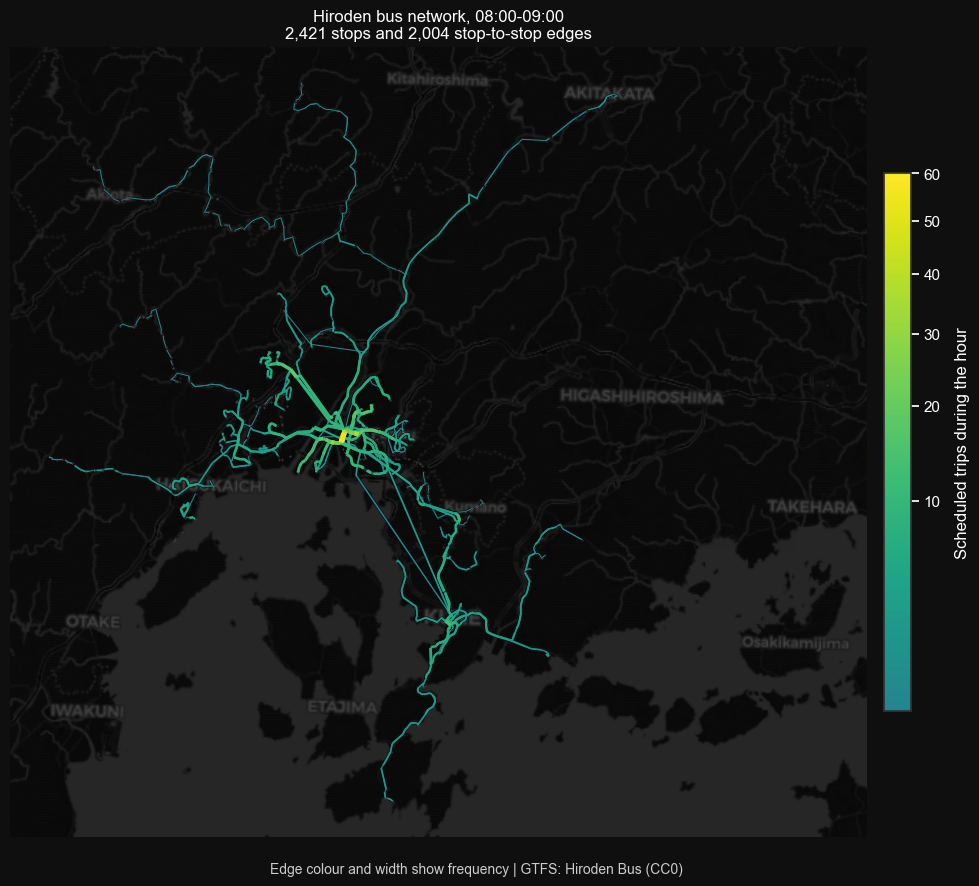

In [27]:
fig, ax = plt.subplots(figsize=(12, 9), facecolor=DARK_BG)

# A square-root scale separates low and high frequencies without letting a few
# busy links dominate. The truncated colour map keeps every edge visible.
bus_edges_plot = stop_edges.sort_values("frequency")  # draw busiest links last
frequency = bus_edges_plot["frequency"].astype(float).clip(lower=1)
frequency_norm = mcolors.PowerNorm(
    gamma=0.5, vmin=frequency.min(), vmax=frequency.max()
)
frequency_cmap = mcolors.LinearSegmentedColormap.from_list(
    "bus_frequency", plt.cm.viridis(np.linspace(0.45, 1.0, 256))
)
scaled_frequency = frequency_norm(frequency.to_numpy())
edge_width = 0.75 + 3.25 * scaled_frequency

# Keep stops subordinate to the network and draw every edge above them.
stop_nodes.plot(
    ax=ax, color=LIGHT_EDGE, markersize=0.1, alpha=0.20, zorder=1
)

# A dark casing separates overlapping services from the basemap.
bus_edges_plot.plot(
    ax=ax, color=DARK_BG, linewidth=edge_width + 1.0, alpha=0.90, zorder=2
)
bus_edges_plot.plot(
    ax=ax, column="frequency", cmap=frequency_cmap, norm=frequency_norm,
    linewidth=edge_width, alpha=1.0, zorder=3,
)

add_darkmatter_basemap(ax, stop_edges.crs)
style_dark_axes(
    ax,
    f"Hiroden bus network, 08:00-09:00\n"
    f"{len(stop_nodes):,} stops and {len(stop_edges):,} stop-to-stop edges",
)

frequency_legend = ScalarMappable(norm=frequency_norm, cmap=frequency_cmap)
frequency_legend.set_array([])
cbar = fig.colorbar(frequency_legend, ax=ax, shrink=0.68, pad=0.015)
cbar.set_label("Scheduled trips during the hour", color=LIGHT_EDGE, labelpad=10)
cbar.ax.tick_params(colors=LIGHT_EDGE)
cbar.outline.set_edgecolor(DARK_EDGE)

fig.text(
    0.5, 0.02,
    "Edge colour and width show frequency | GTFS: Hiroden Bus (CC0)",
    ha="center", fontsize=10, color=ATTRIBUTION_COLOR,
)
plt.tight_layout(rect=(0, 0.04, 1, 1))
plt.show()

The feed covers the whole of Hiroshima Prefecture, which is far more than we need. `c2g.clip_graph()` cuts it down to a catchment around the centre, so we keep only the stops and services a bus could plausibly bring you from.

In [28]:
BUS_CLIP_M = 10_000            # buses carry you well past walking range, so keep a wide catchment

# The origin of the isochrones below, projected to match every other layer
CENTER_PT = gpd.GeoSeries([Point(CENTER_POINT[1], CENTER_POINT[0])], crs=4326).to_crs(epsg=EPSG).iloc[0]

# Keep the transit within reach of the centre and discard the rest of the prefecture
study_area = CENTER_PT.buffer(BUS_CLIP_M)
stop_nodes_clip, stop_edges_clip = c2g.clip_graph((stop_nodes, stop_edges), area=study_area)

In [29]:
print(f"Bus stops       : {len(stop_nodes):5d} in the prefecture -> {len(stop_nodes_clip):4d} within {BUS_CLIP_M // 1000} km")
print(f"Bus edges       : {len(stop_edges):5d} in the prefecture -> {len(stop_edges_clip):4d} within {BUS_CLIP_M // 1000} km")

Bus stops       :  2421 in the prefecture ->  950 within 10 km
Bus edges       :  2004 in the prefecture ->  988 within 10 km


We also need a much wider walking network than the one from Section 2. We are about to ask how far you get in anything up to thirty minutes, and thirty minutes of walking covers roughly 2.4 km, so a 1 km network would clip the answer long before the clock ran out.

The next cell therefore asks OpenStreetMap for a 10 km walkable network. It is by far the heaviest request in this notebook: expect a few minutes, and longer when a room full of people queries Overpass at once. Run it once and leave it alone.

In [30]:
WALKING_SPEED_MPS = 4.8 / 3.6  # 4.8 km/h, an unhurried walking pace
WALK_DIST_M = 10000             # 10 km

G_walk = ox.graph_from_point(CENTER_POINT, dist=WALK_DIST_M, network_type="walk")

We will then set the travel time in seconds for each street segment.

In [31]:
# Convert the graph into GeoDataFrames
walk_nodes, walk_edges = c2g.nx_to_gdf(G_walk)

# Project to the same CRS as the other layers
walk_nodes = walk_nodes.to_crs(epsg=EPSG)
walk_edges = walk_edges.to_crs(epsg=EPSG)

# Compute travel time for each edge based on its length and the walking speed
walk_edges["travel_time_sec"] = walk_edges.length / WALKING_SPEED_MPS

print(f"Walking network : {len(walk_nodes)} intersections, {len(walk_edges)} segments")

Walking network : 61291 intersections, 184128 segments


We now have two graphs of streets and bus transits. In many practical situation, analysts might need to know the accessibility in cities by different settings of modality. But how can we integrate multiple graphs in a single data structure?

-> There is a type of graph called **heterogeneous graph**, which can accommodate multiple types of node and edge at once.

`city2graph` expresses this as two dictionaries of nodes and edges (both containing `gpd.GeoDataFrame` as values):

- `nodes`: `{"node": gpd.GeoDataFrame, ...}`
- `edges`: `{(source type, relation, target type), gpd.GeoDataFrame, ...}`

Let's first create a heterogeneous graph from the two existing layers of graphs.

In [32]:
hetero_nodes = {
    "street": walk_nodes,
    "stop": stop_nodes_clip,
}

hetero_edges = {
    ("street", "is_connected_to", "street"): walk_edges,
    ("stop", "is_next_to", "stop"): stop_edges_clip,
}

print("Node types:")
for node_type, gdf in hetero_nodes.items():
    print(f"  {node_type:10s} {len(gdf):6d} nodes")

print("Edge types:")
for edge_type, gdf in hetero_edges.items():
    print(f"  {str(edge_type):46s} {len(gdf):6d} edges")

Node types:
  street      61291 nodes
  stop          950 nodes
Edge types:
  ('street', 'is_connected_to', 'street')        184128 edges
  ('stop', 'is_next_to', 'stop')                    988 edges


We still need to ensure the connection between these two layers! 

`c2g.bridge_nodes()` does that by connecting each stop to its nearest street node. If you apply this function, a new edge type `("stop", "is_nearby", "street")` can be generated.

In [33]:
BRIDGE_KEY = ("stop", "is_nearby", "street")

_, bridge_edges = c2g.bridge_nodes(
    nodes_dict=hetero_nodes,
    source_node_types=["stop"],
    target_node_types=["street"],
    k=1,
)

# The bridge is a short walk, so it is weighted like any other walkable edge
bridge_edges[BRIDGE_KEY]["travel_time_sec"] = bridge_edges[BRIDGE_KEY].length / WALKING_SPEED_MPS
hetero_edges.update(bridge_edges)

print("Edge types:")
for edge_type, gdf in hetero_edges.items():
    print(f"  {str(edge_type):46s} {len(gdf):6d} edges")

Edge types:
  ('street', 'is_connected_to', 'street')        184128 edges
  ('stop', 'is_next_to', 'stop')                    988 edges
  ('stop', 'is_nearby', 'street')                   950 edges


With streets and stops in a single graph, we can ask a question that neither network could answer alone: **where can you get to in fifteen minutes? Or five? Or thirty?**

`c2g.create_isochrone()` runs a shortest-path search from a centre point out to a travel-time budget, and draws a polygon around everything it reached. Hand it a list of budgets and you get one polygon per budget from a single call.

The comparison is the point here. We run it twice on the *same* node layers, and the only difference is which edge types we hand over:

- **walking only**: leave `("stop", "is_next_to", "stop")` out of the edge dictionary, so the search can still reach a stop but has no edge to board
- **walking and bus**: pass every edge type, and the search is free to board

That is the whole value of building the heterogeneous graph. The counterfactual costs one dictionary comprehension.

One detail on the second call. It also passes `cut_edge_types=[("stop", "is_next_to", "stop")]`, which does something quite different from what we just did: it drops the bus lines *after* the search has finished, from the drawing only. Without it the hull would stretch along every bus corridor into one enormous blob. With it, the shape hugs the streets you can walk around each stop the bus dropped you at, which is what "reachable" ought to look like on a map.

In [34]:
TRAVEL_TIMES_MIN = [5, 10, 15, 20, 25, 30]

# Largest budget first, so that later the shorter bands are drawn on top of the longer ones
thresholds_sec = [minutes * 60 for minutes in sorted(TRAVEL_TIMES_MIN, reverse=True)]

# Walking only. k=60 keeps the 30-minute layer on the k-NN hull path instead of the alpha fallback.
iso_walk = c2g.create_isochrone(
    nodes=walk_nodes,
    edges=walk_edges,
    center_point=CENTER_PT,
    threshold=thresholds_sec,
    edge_attr="travel_time_sec",
    method="concave_hull_knn", # others can be chosen from "concave_hull_alpha", "convex_hull", and "buffer"
    k=60
)

# Walking + bus
iso_bus = c2g.create_isochrone(
    nodes=hetero_nodes,
    edges=hetero_edges,
    center_point=CENTER_PT,
    threshold=thresholds_sec,
    edge_attr="travel_time_sec",
    cut_edge_types=[("stop", "is_next_to", "stop")],
    method="concave_hull_knn", # others can be chosen from "concave_hull_alpha", "convex_hull", and "buffer"
    k=60
)

# Both calls were given the same list of thresholds, so the rows line up
areas = pd.DataFrame({
    "minutes": (iso_walk["threshold"] // 60).astype(int),
    "walking only (km2)": (iso_walk.area / 1e6).round(2),
    "walking and bus (km2)": (iso_bus.area / 1e6).round(2).to_numpy(),
})
areas["times larger"] = (areas["walking and bus (km2)"] / areas["walking only (km2)"]).round(1)
display(areas.sort_values("minutes").reset_index(drop=True))

,minutes,walking only (km2),walking and bus (km2),times larger
0,5,0.16,0.16,1.0
1,10,1.02,1.02,1.0
2,15,2.52,2.82,1.1
3,20,4.93,7.34,1.5
4,25,7.85,15.79,2.0
5,30,11.66,31.73,2.7


Let's plot the isochrones!

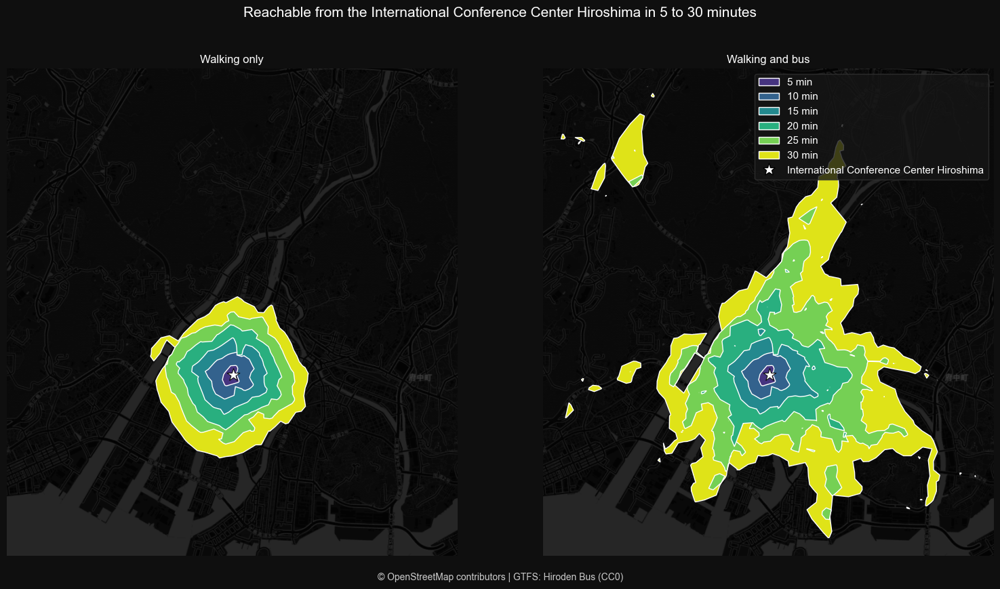

In [35]:
palette = plt.get_cmap("viridis")(np.linspace(0.15, 0.95, len(TRAVEL_TIMES_MIN)))
colour_by_minutes = dict(zip(sorted(TRAVEL_TIMES_MIN), palette))

# Both panels share the extent of the larger isochrone, so they can be compared directly
minx, miny, maxx, maxy = iso_bus.total_bounds
pad = 0.04 * max(maxx - minx, maxy - miny)

fig, axes = plt.subplots(1, 2, figsize=(16, 9), facecolor=DARK_BG)

for ax, iso, title in [
    (axes[0], iso_walk, "Walking only"),
    (axes[1], iso_bus, "Walking and bus"),
]:
    # Rows run from the longest budget down, so each shorter band lands on top
    for _, row in iso.iterrows():
        minutes = int(row["threshold"] // 60)
        gpd.GeoSeries([row.geometry], crs=iso.crs).plot(
            ax=ax, color=colour_by_minutes[minutes], alpha=1, zorder=1, edgecolor=None
        )
    ax.scatter(
        CENTER_PT.x, CENTER_PT.y,
        s=200, marker="*", color="white", edgecolor=DARK_BG, linewidth=0.8, zorder=5,
    )
    ax.set_xlim(minx - pad, maxx + pad)
    ax.set_ylim(miny - pad, maxy + pad)
    add_darkmatter_basemap(ax, iso.crs)
    style_dark_axes(ax, title)

handles = [Patch(facecolor=colour_by_minutes[m], label=f"{m} min") for m in sorted(TRAVEL_TIMES_MIN)]
handles.append(
    Line2D([0], [0], marker="*", color="none", markerfacecolor="white", markersize=14, label=CENTER_NAME)
)
legend = axes[1].legend(handles=handles, loc="upper right", facecolor=DARK_PANEL, edgecolor=DARK_EDGE)
for text in legend.get_texts():
    text.set_color("white")

fig.suptitle(
    f"Reachable from the {CENTER_NAME} in {min(TRAVEL_TIMES_MIN)} to {max(TRAVEL_TIMES_MIN)} minutes",
    color="white", fontsize=15,
)
fig.text(
    0.5, 0.04, "© OpenStreetMap contributors | GTFS: Hiroden Bus (CC0)",
    ha="center", fontsize=10, color=ATTRIBUTION_COLOR,
)
# Leave room at the top for the suptitle and at the bottom for the attribution,
# so neither collides with the panel titles.
plt.tight_layout(rect=(0, 0.06, 1, 0.94))
plt.show()

### What could you see?

- What could be the unique pattern of isochrones by each different modality assumption? Why did it happen? ([Hint](https://www.hiroden.co.jp/bus/route/w-60-61.html))
- What could be the drawback of this current assumption?
- How could you apply this method to the real analytical cases?

### 3.2 How to define "being close"

Transport gave us edges for free, because someone had already decided that two stops are related when a bus runs between them.

For most spatial data, nobody has made that decision. You have points, and you have to say what "related" means. This is a modelling choice, not a property of the data, and different choices give genuinely different graphs from identical inputs.

To see this, we need some points. We will take the shops and amenities that OpenStreetMap records around the conference venue, and sample a few hundred of them so the figures stay readable.

In [36]:
POI_TAGS = {"amenity": True, "shop": True}
N_PLACES = 400

poi_raw = ox.features_from_point(CENTER_POINT, tags=POI_TAGS, dist=1000)

places = poi_raw.to_crs(epsg=EPSG).copy()
# Some POIs are mapped as buildings rather than points, so reduce every geometry to its centroid
places["geometry"] = places.geometry.centroid
places = places[["name", "geometry"]].sample(n=min(N_PLACES, len(places)), random_state=SEED)
places = places.reset_index(drop=True)  # plain integer node ids

print(f"OpenStreetMap records {len(poi_raw)} shops and amenities within 1 km of the {CENTER_NAME}")
print(f"Sampled {len(places)} of them so the figures stay readable")
display(places.head())

OpenStreetMap records 2556 shops and amenities within 1 km of the International Conference Center Hiroshima
Sampled 400 of them so the figures stay readable


,name,geometry
0,NaN,POINT (265741.091 3808412.388)
1,NaN,POINT (265450.106 3808869.782)
2,NaN,POINT (266110.019 3808555.651)
3,NaN,POINT (266365.18 3808872.8)
4,Petit Sige,POINT (266644.154 3808678.539)


Here are four rules for the same points.

- **k-nearest neighbours** (`c2g.knn_graph`): connect each point to its *k* closest. Every node gets exactly *k* edges out, whatever the local density.
- **Fixed radius** (`c2g.fixed_radius_graph`): connect every pair closer than *r* metres. The threshold is a real distance you can defend, but degree now varies with density.
- **k-nearest neighbours by network distance**: the same k-nearest-neighbour rule, but distance is measured along the street network.
- **Fixed radius by network distance**: keep the distance threshold, but connect only places within *r* metres of walking along the street network.

The first two use straight-line distance, while the last two use shortest-path distance along the walkable street network. Two shops fifty metres apart across a river may be much farther apart on foot. Passing the street network to a proximity constructor makes "close" reflect the route that people can actually take.

In [37]:
K = 5
RADIUS_M = 200

_, knn_edges = c2g.knn_graph(places, k=K)
_, radius_edges = c2g.fixed_radius_graph(places, radius=RADIUS_M)

# Network-distance constructors route through the streets, so these calls take longer
_, knn_network_edges = c2g.knn_graph(
    places,
    k=K,
    distance_metric="network",
    network_gdf=walk_edges,
    network_weight="length",
)
_, radius_network_edges = c2g.fixed_radius_graph(
    places,
    radius=RADIUS_M,
    distance_metric="network",
    network_gdf=walk_edges,
    network_weight="length",
)

proximity_graphs = {
    f"k-nearest neighbours (k={K})": knn_edges,
    f"Fixed radius (r={RADIUS_M} m)": radius_edges,
    f"k-nearest neighbours (k={K}), network distance": knn_network_edges,
    f"Fixed radius (r={RADIUS_M} m), network distance": radius_network_edges,
}

for name, edges in proximity_graphs.items():
    print(f"{name:48s} {len(edges):6d} edges")

k-nearest neighbours (k=5)                         1274 edges
Fixed radius (r=200 m)                             8396 edges
k-nearest neighbours (k=5), network distance       1410 edges
Fixed radius (r=200 m), network distance           5068 edges


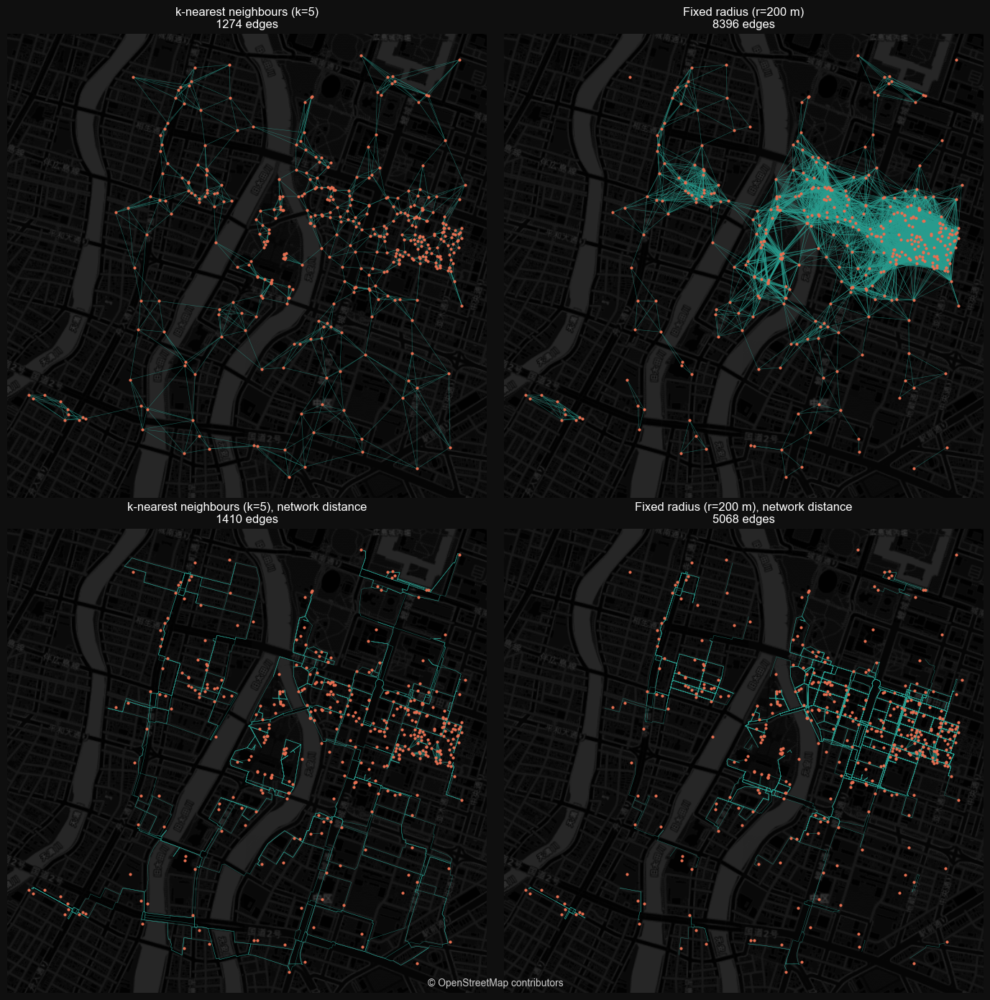

In [38]:
fig, axes = plt.subplots(2, 2, figsize=(14, 14), facecolor=DARK_BG)

for ax, (name, edges) in zip(axes.ravel(), proximity_graphs.items()):
    edges.plot(ax=ax, color=TEAL, linewidth=0.4, alpha=0.6, zorder=1)
    places.plot(ax=ax, color=ORANGE, markersize=4, zorder=2)
    add_darkmatter_basemap(ax, places.crs)
    style_dark_axes(ax, f"{name}\n{len(edges)} edges")

fig.text(0.5, 0.02, "© OpenStreetMap contributors", ha="center", fontsize=10, color=ATTRIBUTION_COLOR)
plt.tight_layout()
plt.show()

### What could you see?

- Count the edges in each panel. Which rule is most generous, and which is most frugal?
- Find a sparse part of the map. What has k-nearest neighbours done there that fixed-radius has not, and which behaviour do you want?
- Compare each straight-line graph with its network-distance counterpart. Where do they disagree? Does the disagreement fall where you would expect?
- If you were modelling "shops that compete with each other", which of the four would you choose, and why?

City2Graph also provides other rules:

- `c2g.delaunay_graph()`, plus `c2g.gabriel_graph()`, `c2g.relative_neighborhood_graph()`, and `c2g.euclidean_minimum_spanning_tree()`, a family of increasingly sparse planar graphs
- `c2g.waxman_graph()`, a probabilistic rule where the chance of an edge decays with distance

Points are not the only geometry. For **polygons**, the natural rule is adjacency, and `c2g.contiguity_graph()` builds it: `"rook"` connects polygons sharing an edge, `"queen"` connects those sharing an edge or a corner. Keep this one in mind, because it is the first graph you will build in Part 2.

And two more, for when the units themselves have to be derived:

- `c2g.create_tessellation()` grows cells from buildings, giving morphological units instead of an imposed grid
- `c2g.morphological_graph()` assembles buildings, their tessellation cells, and the streets into a single structure
- `c2g.dual_graph()` inverts a network so that street *segments* become the nodes, which is how space syntax looks at a city

### 3.3 Metapaths

We have already built a heterogeneous graph in 3.1, without dwelling on it. It is worth naming the pattern, because Part 2 depends on it.

A **homogeneous** graph has one kind of node and one kind of edge. Everything so far in Sections 1 and 2 was homogeneous: intersections joined by streets, points joined by proximity.

A **heterogeneous** graph keeps several kinds at once, and labels every edge with the types it joins. The three-part key is the whole idea:

```
(source node type, relation name, target node type)
```

In 3.1 we had three of them:

- `("street", "is_connected_to", "street")`, the pavement
- `("stop", "is_next_to", "stop")`, the bus rides
- `("stop", "is_nearby", "street")`, the connection between the two

The isochrone search crossed all three without being told they were different, which is exactly what you want: a journey does not care about your schema.

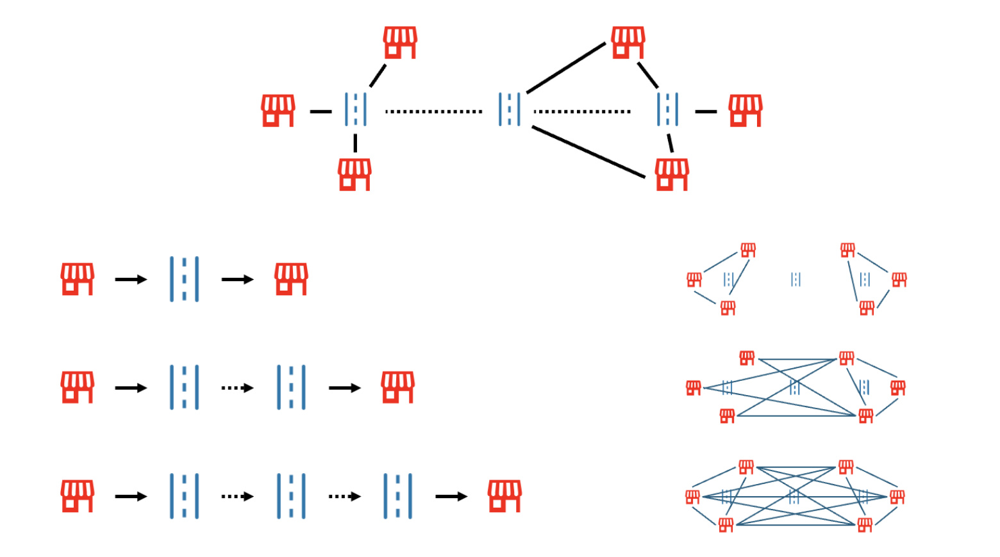

Reference: [*Sato et al. (2026)*](https://doi.org/10.1016/j.compenvurbsys.2026.102492)

Heterogeneous graphs raise a question. Often you care about only **one** node type, but the relationship you want runs *through* the others.

"Which POIs are within a 15-minute walk of each other?" is a question about POIs. 

But the answer lives in the street network: POI → nearest intersection → streets → nearest intersection → POI.

A **metapath** collapses that multi-hop route into a single direct edge between the endpoints you care about. 

City2Graph offers two ways to build one:

- `c2g.add_metapaths()`, when you can write the type sequence explicitly
- `c2g.add_metapaths_by_weight()`, when you want every path under a budget, such as "any route totalling under fifteen minutes"

Below we apply both methods to the same heterogeneous graph. 

`add_metapaths()` follows one explicit sequence with a fixed number of street hops, seven in the cell below. 

`add_metapaths_by_weight()` searches any number of street hops but keeps only routes within a five-minute walking budget.

In [39]:
STREET_KEY = ("street", "is_connected_to", "street")
PLACE_BRIDGE_KEY = ("place", "is_nearby", "street")
PLACE_BRIDGE_REVERSE_KEY = ("street", "is_nearby", "place")
STREET_HOPS = 7
WALK_BUDGET_SEC = 5 * 60

place_nodes = {"place": places, "street": walk_nodes}

_, place_bridge = c2g.bridge_nodes(
    nodes_dict=place_nodes,
    source_node_types=["place"],
    target_node_types=["street"],
    k=1,
)
place_bridge[PLACE_BRIDGE_KEY]["travel_time_sec"] = (
    place_bridge[PLACE_BRIDGE_KEY].length / WALKING_SPEED_MPS
)

base_place_edges = {
    STREET_KEY: walk_edges,
    PLACE_BRIDGE_KEY: place_bridge[PLACE_BRIDGE_KEY],
}

# Method 1: materialise one explicitly typed, fixed-hop sequence
hop_sequence = (
    [PLACE_BRIDGE_KEY]
    + [STREET_KEY] * STREET_HOPS
    + [PLACE_BRIDGE_REVERSE_KEY]
)
_, hop_place_edges = c2g.add_metapaths(
    nodes=place_nodes,
    edges=base_place_edges,
    sequence=hop_sequence,
    new_relation_name=f"{STREET_HOPS}_street_hops",
    edge_attr="travel_time_sec",
    directed=False,
)
hop_metapath_edges = hop_place_edges[("place", f"{STREET_HOPS}_street_hops", "place")]

# Method 2: search across any number of hops within a walking-time budget
_, weighted_place_edges = c2g.add_metapaths_by_weight(
    nodes=place_nodes,
    edges=base_place_edges,
    weight="travel_time_sec",
    threshold=WALK_BUDGET_SEC,
    new_relation_name="5_min_walk",
    endpoint_type="place",
    edge_types=[PLACE_BRIDGE_KEY, STREET_KEY],
    directed=False,
)
weighted_metapath_edges = weighted_place_edges[("place", "5_min_walk", "place")]

metapath_summary = pd.DataFrame(
    {
        "method": ["add_metapaths", "add_metapaths_by_weight"],
        "rule": [f"{STREET_HOPS} street hops", f"at most {WALK_BUDGET_SEC // 60} minutes"],
        "place-to-place edges": [len(hop_metapath_edges), len(weighted_metapath_edges)],
    }
)
display(metapath_summary)

,method,rule,place-to-place edges
0,add_metapaths,7 street hops,8649
1,add_metapaths_by_weight,at most 5 minutes,12512


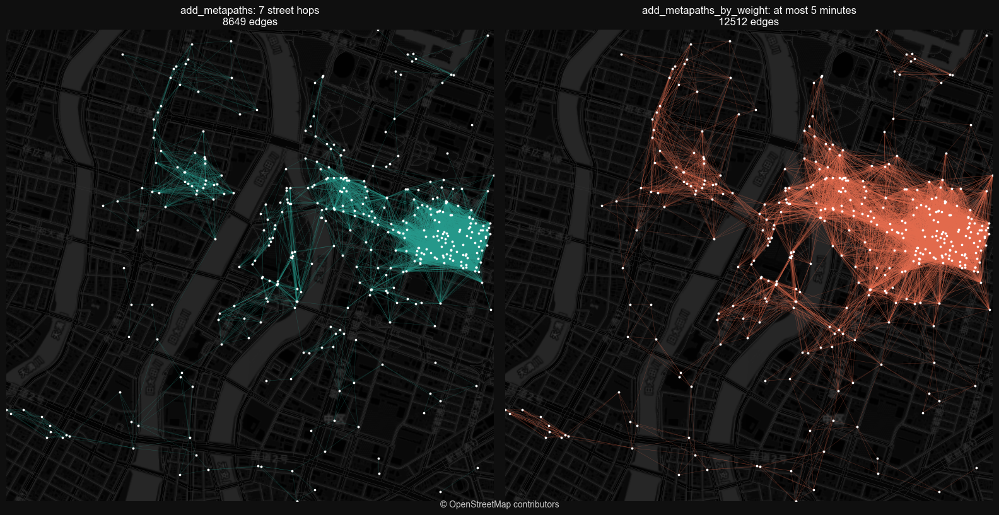

In [40]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8), facecolor=DARK_BG)

comparison = [
    (f"add_metapaths: {STREET_HOPS} street hops", hop_metapath_edges, TEAL),
    (
        f"add_metapaths_by_weight: at most {WALK_BUDGET_SEC // 60} minutes",
        weighted_metapath_edges,
        ORANGE,
    ),
]

for ax, (title, edges, colour) in zip(axes, comparison):
    walk_edges.plot(ax=ax, color=DARK_EDGE, linewidth=0.3, alpha=0.6, zorder=1)
    edges.plot(ax=ax, color=colour, linewidth=0.35, alpha=0.35, zorder=2)
    places.plot(ax=ax, color=LIGHT_EDGE, markersize=3, zorder=3)
    ax.set_xlim(places.total_bounds[0], places.total_bounds[2])
    ax.set_ylim(places.total_bounds[1], places.total_bounds[3])
    add_darkmatter_basemap(ax, places.crs)
    style_dark_axes(ax, f"{title}\n{len(edges)} edges")

fig.text(0.5, 0.02, "© OpenStreetMap contributors", ha="center", fontsize=10, color=ATTRIBUTION_COLOR)
plt.tight_layout()
plt.show()

Both methods create direct **place-to-place** edges, but they encode different assumptions. `add_metapaths()` follows the explicit typed sequence, so its neighbourhood is controlled by the number of street hops. `add_metapaths_by_weight()` uses Dijkstra's algorithm and admits any route whose accumulated `travel_time_sec` remains within the budget, regardless of its hop count. The plotted edges are straight lines between endpoints, but the relations were derived from the street network.

In Part 2 you will run `add_metapaths_by_weight()` on H3 hexagons instead of places, with a fifteen-minute budget instead of five, and the result will be the graph your neural network trains on:

```
("hex", "15_min_walk", "hex")
```

At which point we need to talk about the neural network!

## Section 4. Introduction to Graph Neural Networks

We can now build graphs from various spatial relations in a city. What we will do next is to **learn** from them.

Network analysis could tell us about the property of structure from the graphs constructed, but does not clarify the nuances with the other aspects in cities.

In reality, we have rich information about the characteristics, such as the existence of POIs (e.g., restaurants, cafes, bars, etc.) or land-uses (e.g., residential, industrial, etc.). Within cities, these components interact to each other and form the uniqueness of neighbourhoods, districts, and eventually the cities.

We will look at **Graph Neural Networks**, which is a type of models for learning properties of graphs by neural network!

### 4.1 Why GNNs, and what people use them for

Start with why the usual tools do not fit.

Basic architecture (multilayer perceptron)
- Each row in the tabular data will be treated independently.

Pixel-based architecture (e.g., Convolutional Neural Network (CNN), Vision Transformer (ViT))
- The relations between entities (pixels) are strictly defined as grid system (vertically and horizontally).

What if we have graphs? Intersections might have three or four street segments. Some stations might have more connections as a hub.

So, the operation need to accept a **variable number of neighbours** and give the same answer **whatever order they arrive in**.

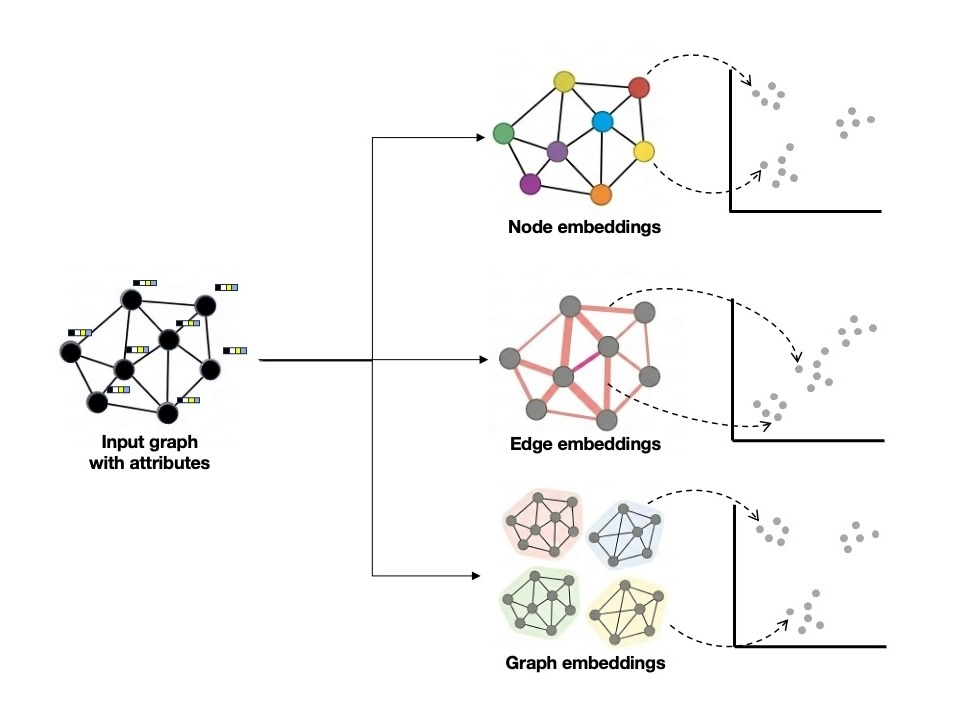

Reference: [*Sato et al. (2026)*](https://doi.org/10.1016/j.compenvurbsys.2026.102492)

It is worth knowing what kind of tasks can be considered in GNNs before seeing how they work. Tasks are usually grouped by what you are predicting.

**Node level**, a prediction per node:

- classifying each cell by urban function or typology
- estimating house prices, footfall, or air quality where measurements are sparse
- learning an embedding per node with no labels at all, which is what Part 2 does

**Edge level**, a prediction per edge or per pair:

- link prediction: which connections are missing from an incomplete network
- flow estimation: how many trips run between two zones
- travel time or congestion on individual segments

**Graph level**, one prediction for a whole graph:

- classifying neighbourhoods, or whole cities, by their form
- comparing street network types across places

One honest caveat before we continue, because it will save you time later.

A GNN is not automatically the right tool! If the outcome you care about is well explained by each unit's **own** attributes, then gradient boosting on that same table will usually be more accurate, far faster to train, and much easier to explain to whoever is paying for it.

A GNN earns its cost when the **neighbourhood carries signal that the unit itself does not**. Spillover, accessibility, contagion, position in a system. That is a real condition, and it is worth checking rather than assuming.

### 4.2 Message passing

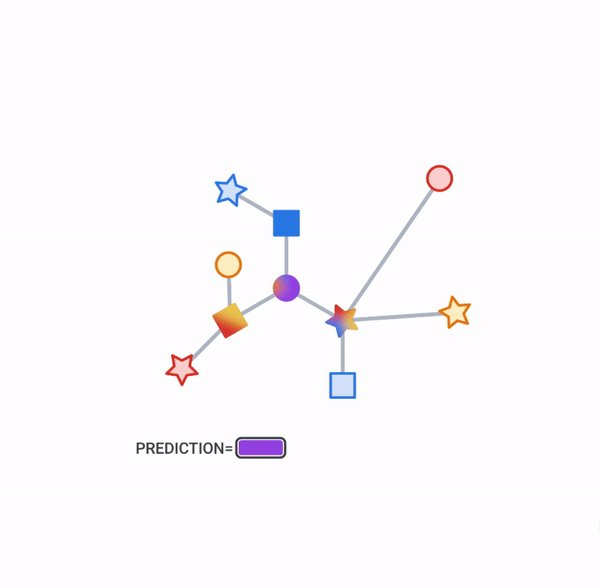

Reference: [*Google Research (2024)*](https://research.google/blog/graph-neural-networks-in-tensorflow/)

Well-known GNNs are driven by a mechanism called message passing framework. 

Simply speaking: **Each node updates itself by mixing in what its neighbours know.**

Each layer of GNNs will process:

1. every node looks at each neighbour and forms a message
2. the messages arriving at a node are aggregated, by sum or mean, so that order does not matter
3. the node combines that aggregate with its own current state to get its new state

If you make the message "just send your feature vector" and the aggregation "take the mean", then one whole round is a single matrix multiplication: $\mathbf{A}\mathbf{X}$.

This is the simplest case, but for example in Graph Convolutional Network (GCN),
- the $\mathbf{A}$ is normalised (s.t. $\mathbf{\hat{A}}$)
- weight (parameter) matrix $\mathbf{W}$ is multiplied (s.t. $\mathbf{W} \mathbf{\hat{A}} \mathbf{X}$)
- non-linear activation like $\text{ReLU}(\cdot)$ is applied after the matrix multiplication. (s.t. $\text{ReLU}(\mathbf{W} \mathbf{\hat{A}} \mathbf{X})$)

#### A small task: who joins which club?

Zachary collected this network while the club was falling apart, and the dataset records how the story ended. Every member carries a `club` attribute: `"Mr. Hi"`, the instructor, who is node 0, or `"Officer"`, the club president, who is node 33. The club split, and each of the 34 members went to one side or the other.

In [41]:
karate_G = nx.karate_club_graph()
KARATE_POS = nx.kamada_kawai_layout(karate_G)
A = nx.to_numpy_array(karate_G, weight=None)

Suppose we only knew where the two leaders went. **Can we predict the faction of the other 32 members from the friendships alone?**

Nothing that a member carries on their own answers this. There is no rank, no age, no attendance record, and none of it would settle a dispute about loyalty anyway. All of the signal sits in who is friends with whom, which is exactly the condition described in the caveat above, where a GNN is worth its cost.

So we give every node two numbers, one per faction, fill them in for the two leaders we know, leave everybody else at zero, and let message passing carry what is known along the edges.

In [42]:
# Ground truth, kept aside: which faction each member actually joined
y_true = np.array(
    [0 if karate_G.nodes[n]["club"] == "Mr. Hi" else 1 for n in karate_G.nodes]
)

In [43]:
# Initial node attributes: two columns, [Mr. Hi, Officer]. Only the two leaders are known to us.
H0 = np.zeros((karate_G.number_of_nodes(), 2))
H0[0, 0] = 1.0    # node 0 is Mr. Hi himself
H0[33, 1] = 1.0   # node 33 is the club president

In [44]:
H0.shape

(34, 2)

In [45]:
H0

array([[1., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 1.]])

One round of message passing is one multiplication by the adjacency matrix. Each node hands its current two-column state to every neighbour, and each node sums whatever arrives.

The loop below repeats that for 30 rounds and keeps the state after each one, so the next two cells can watch the two labels we started from spread outwards along the friendships.

In [46]:
# One round of message passing: one matrix multiplication.
ROUNDS = 30
node_embedding_dict = {0: H0}

for r in range(1, ROUNDS + 1):
    node_embedding_dict[r] = A @ node_embedding_dict[r - 1]

To turn those two columns back into a prediction, compare them: whichever is larger names the faction the node leans towards, and the gap between them is how strongly it leans. A node the messages have not reached yet still holds two zeros, so it has no opinion and we count it as undecided.

The table below applies that read-out after every round, and records how many members have been reached, how many of them were placed in the right faction, and how far apart the margins have spread.

In [47]:
def read_out(H):
    """Turn the two propagated columns into one prediction per node."""
    margin = H[:, 0] - H[:, 1]   # positive leans Mr. Hi, negative leans Officer
    decided = margin != 0        # a node nothing has reached yet holds no opinion
    pred = np.where(margin > 0, 0, 1)
    return margin, pred, decided

rows = []
for r, H in node_embedding_dict.items():
    margin, pred, decided = read_out(H)
    correct = int((pred[decided] == y_true[decided]).sum())
    rows.append(
        {
            "round": r,
            "decided": int(decided.sum()),
            "correct": correct,
            "accuracy": correct / len(y_true),   # undecided members count as not assigned
            "margin spread": margin.max() - margin.min(),
        }
    )

history = pd.DataFrame(rows).set_index("round").round(3)
display(history.loc[[0, 1, 2, 3, 4, 5, 10, 20, 30]])

,decided,correct,accuracy,margin spread
round,,,,
0,2,2,0.059,2.000000e+00
1,25,25,0.735,2.000000e+00
2,31,27,0.794,2.500000e+01
3,34,33,0.971,5.200000e+01
4,34,32,0.941,4.700000e+02
5,34,33,0.971,1.485000e+03
10,34,32,0.941,5.676836e+06
20,34,17,0.500,2.536067e+14
30,34,17,0.500,4.273174e+22


Finally, we'll visualise the node embedding by the rounds of message passing (layers of GNNs).

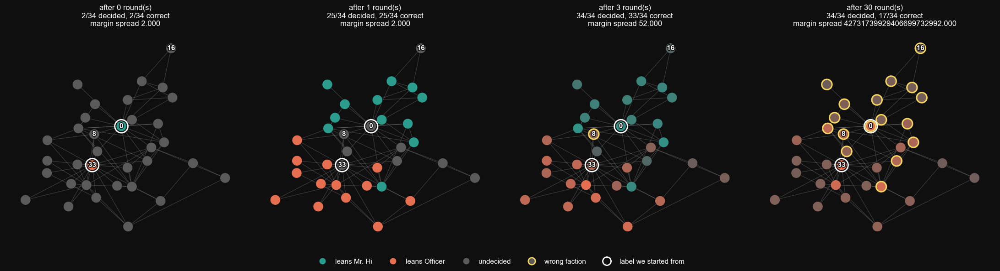

In [48]:
SHOWN_ROUNDS = [0, 1, 3, 30]
TRACKED = [0, 8, 16, 33]     # the nodes worth following in the text below
WRONG_COLOR = "#f4d35e"

# Teal for Mr. Hi, orange for the Officer, grey in the middle for the undecided
faction_cmap = mcolors.LinearSegmentedColormap.from_list("faction", [ORANGE, "#5a5a5a", TEAL])

fig, axes = plt.subplots(1, len(SHOWN_ROUNDS), figsize=(22, 6), facecolor=DARK_BG)

for ax, r in zip(axes, SHOWN_ROUNDS):
    ax.set_facecolor(DARK_BG)
    margin, pred, decided = read_out(node_embedding_dict[r])

    # Summing grows the numbers as it spreads them, so each panel is rescaled
    # by its own largest margin. Compare the patterns, not the intensity of the colour.
    scale = np.abs(margin).max() or 1.0
    wrong = decided & (pred != y_true)

    nx.draw_networkx_edges(karate_G, KARATE_POS, ax=ax, edge_color=LIGHT_EDGE, width=0.8, alpha=0.2)
    nx.draw_networkx_nodes(
        karate_G,
        KARATE_POS,
        ax=ax,
        node_size=260,
        node_color=margin / scale,
        cmap=faction_cmap,
        vmin=-1,
        vmax=1,
        linewidths=list(np.where(wrong, 2.2, 0.6)),
        edgecolors=list(np.where(wrong, WRONG_COLOR, DARK_BG)),
    )
    # The two members whose faction we actually know
    nx.draw_networkx_nodes(
        karate_G, KARATE_POS, ax=ax, nodelist=[0, 33], node_size=430,
        node_color="none", linewidths=2.0, edgecolors=LIGHT_EDGE,
    )
    tracked_labels = nx.draw_networkx_labels(
        karate_G, KARATE_POS, ax=ax, labels={n: str(n) for n in TRACKED},
        font_size=11, font_color="white", font_weight="bold",
    )
    for text in tracked_labels.values():
        text.set_path_effects([pe.withStroke(linewidth=2.5, foreground=DARK_BG)])

    correct = int((pred[decided] == y_true[decided]).sum())
    style_dark_axes(
        ax,
        f"after {r} round(s)\n{int(decided.sum())}/{len(y_true)} decided, "
        f"{correct}/{len(y_true)} correct\nmargin spread {margin.max() - margin.min():.3f}",
    )

legend_handles = [
    Line2D([], [], marker="o", linestyle="", markersize=11, markeredgecolor=DARK_BG,
           markerfacecolor=TEAL, label="leans Mr. Hi"),
    Line2D([], [], marker="o", linestyle="", markersize=11, markeredgecolor=DARK_BG,
           markerfacecolor=ORANGE, label="leans Officer"),
    Line2D([], [], marker="o", linestyle="", markersize=11, markeredgecolor=DARK_BG,
           markerfacecolor="#5a5a5a", label="undecided"),
    Line2D([], [], marker="o", linestyle="", markersize=11, markerfacecolor="#5a5a5a",
           markeredgecolor=WRONG_COLOR, markeredgewidth=2, label="wrong faction"),
    Line2D([], [], marker="o", linestyle="", markersize=13, markerfacecolor="none",
           markeredgecolor=LIGHT_EDGE, markeredgewidth=2, label="label we started from"),
]
fig.legend(handles=legend_handles, loc="lower center", ncol=5, frameon=False,
           labelcolor="white", fontsize=11)

plt.tight_layout(rect=(0, 0.06, 1, 1))
plt.show()

Note that this is a toy prediction: there is no loss function and no backpropagation, only plain message passing.

Three consequences, which are the part worth remembering:

- **One layer sees the neighbours of each node.** A node's new value depends only on who it is directly connected to.
- **Two layers see the neighbours of the neighbours**, because those neighbours had already mixed in *their* neighbours. Stacking layers widens the receptive field, exactly as it does in a CNN.
- **Too many layers see nothing at all.** Every node converges to the same values, useful information is averaged away, and accuracy drops. This is **over-smoothing**, and it is why most GNNs are two or three layers deep rather than fifty. Depth is not free here.

We can see the **over-smoothing** as follows:

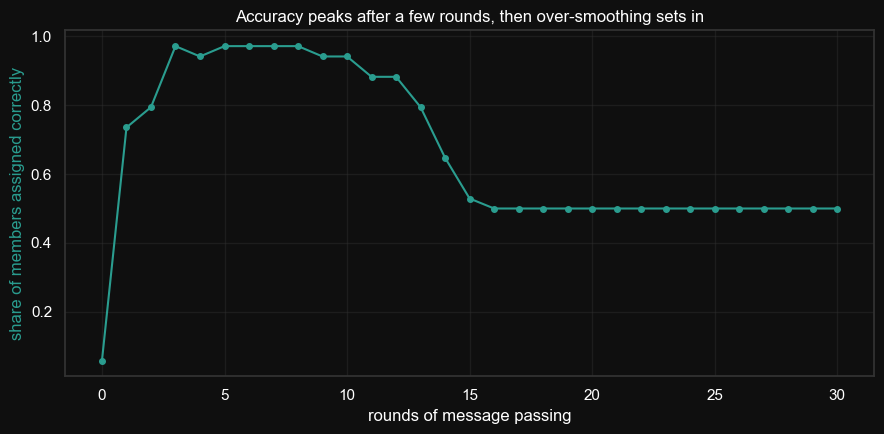

In [49]:
fig, ax = plt.subplots(figsize=(9, 4.5), facecolor=DARK_BG)
ax.set_facecolor(DARK_BG)

ax.plot(history.index, history["accuracy"], color=TEAL, marker="o", markersize=4)
ax.set_xlabel("rounds of message passing", color="white")
ax.set_ylabel("share of members assigned correctly", color=TEAL)
ax.tick_params(colors="white")
ax.grid(color=DARK_EDGE, alpha=0.4)

for spine in ax.spines.values():
    spine.set_color(DARK_EDGE)
ax.set_title("Accuracy peaks after a few rounds, then over-smoothing sets in", color="white")

plt.tight_layout()
plt.show()

### 4.3 Models of GNNs

A real layer of GNNs adds one thing to what you just computed: a learnable weight matrix $\mathbf{W}$, and an activation function $\sigma$. 

That gives a layer of **Graph Convolutional Network (GCN)** (most basic one):

$$\mathbf{H}^{(l+1)} = \sigma\left(\mathbf{\hat{A}} \mathbf{H}^{(l)} \mathbf{W}^{(l)}\right)$$

- $\mathbf{H}^{(l)}$: node features at layer $l$, one row per node, and $\mathbf{H}^{(0)} = \mathbf{X}$
- $\mathbf{\hat{A}}$: the normalised adjacency matrix with self-loops, the same one you just built
- $\mathbf{W}^{(l)}$: the weights (parameters), learned by gradient descent <- this is to be trained!
- $\sigma$: an activation such as ReLU

Everything from here on is a variation on a single question: **how should the neighbours be weighted?**

#### Graph Attention Network (GAT)

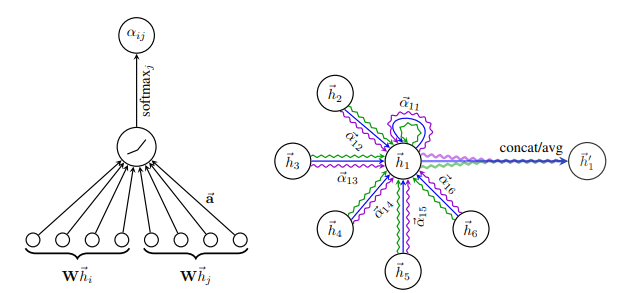

Reference: [*Veličković et al. (2017)*](https://arxiv.org/abs/1710.10903)

In GCN, how much a neighbour counts is decided by $\mathbf{\hat{A}}$ alone, which is to say by degree. That rule is fixed before the model has seen any data. A quiet back street counts as much as the high street beside it, as long as they meet the same intersection.

**GAT** learns those weights instead. For every edge, a small learnable function scores how relevant that neighbour is, and the scores around each node go through a softmax so they sum to one:

$$\mathbf{h}_i^{(l+1)} = \sigma\left(\sum_{j \in \mathcal{N}(i)} \alpha_{ij} \mathbf{W}^{(l)} \mathbf{h}_j^{(l)}\right)$$

- $\mathcal{N}(i)$: the neighbours of node $i$, including itself
- $\alpha_{ij}$: the **attention weight**, how much node $i$ listens to node $j$ <- this is learned, not fixed
- $\mathbf{W}^{(l)}$: the same learnable weights as in GCN

GCN is then just the special case where $\alpha_{ij}$ is decided by degree. In practice several attention functions, called **heads**, are learned in parallel and their outputs combined, which makes training steadier.

Two reasons we use GAT in Part 2. Edges in a city are not equal, and attention lets the model work out which ones matter rather than being told. And `GATConv` in PyTorch Geometric accepts edge features through `edge_dim`, so travel time enters the score directly: a neighbour two minutes away can end up counting for far more than one twenty minutes away.


#### Graph Autoencoder (GAE)

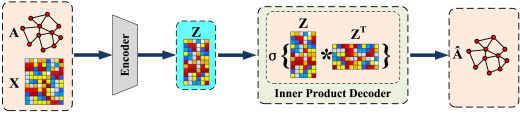

Reference: [*Sun et al. (2021)*](https://www.sciencedirect.com/science/article/pii/S0950705121008261)

Everything above assumed you have something to predict or classify. 

You can also do unsupervised learning with GNNs. One fundamental approach is the **Graph Autoencoder**, which we will use in Part 2.

An autoencoder is a neural network architecture (it does not have to be a GNN) whose task is to reconstruct its input and, in doing so, produce embeddings.

1. The **encoder** is a GNN (e.g., GAT), which turns each node into a short vector $\mathbf{z}_i$ of, say, eight numbers. That vector is the **node embedding**.

2. The **decoder** rebuilds the graph from those vectors. The simplest one asks, for any pair of nodes, how aligned their embeddings are:
$$\mathbf{\hat{A}}_{ij} = \sigma\left(\mathbf{z}_i^\top \mathbf{z}_j\right)$$
In a matrix form, it is:
$$\mathbf{\hat{A}} = \sigma\left(\mathbf{Z} \mathbf{Z}^\top \right)$$

which reads as *"how likely is an edge between $i$ and $j$?"*. The point is what this forces the embeddings to become. To reconstruct its own edges, a node has to carry who its neighbours are and what they look like. So $\mathbf{z}_i$ ends up as a compressed description of the node **and its surroundings**.

#### GraphSAGE

A hub with ten thousand neighbours makes a full aggregation slow. **GraphSAGE** samples a fixed number of neighbours per node at each layer instead of using all of them, which keeps the cost predictable on large graphs.

It also learns an aggregation function rather than memorising the graph, so it can produce an embedding for a node it never saw during training, such as a district added to your study area later. That property is called **inductive** learning, and it matters if you want to train on one city and apply the model to another.


#### Graph Transformer

GAT attends only to a node's immediate neighbours. A **Graph Transformer** lets a node attend to distant nodes as well, which helps when influence is not purely local, for instance when a station on the far side of the city shapes the footfall here.

The price is cost. Attending to everything grows with the square of the number of nodes, so practical versions restrict the candidates one way or another. Worth knowing about, but reach for it after the simpler models rather than before.


#### HAN (Heterogeneous Graph Attention Network)

The models above assume one node type and one edge type. Section 3.3 built something richer: places, streets and stops, with several kinds of edge between them.

**HAN** attends twice over such a graph. First within each metapath, so it learns which neighbours matter along "place to street to place". Then across metapaths, so it learns which relation matters at all, for example whether the bus link or the walking route explains more. If your problem is genuinely multi-layer, this is the family to look at, and the `HeteroData` object in 4.4 is how you feed it.


Putting them side by side:

| Model | How neighbours are weighted | Reach for it when |
| --- | --- | --- |
| GCN | fixed by degree | you want a fast, honest baseline |
| GAT | learned per edge, by attention | edges differ in importance, or carry features such as travel time |
| GraphSAGE | learned, over a sample of neighbours | the graph is large, or you must handle unseen nodes |
| Graph Transformer | learned, beyond immediate neighbours | influence is long-range rather than local |
| HAN | learned per metapath, then across metapaths | several node and edge types matter |

GAE is not a layer in this list. It is a way of **training** any of them without labels: an encoder goes in, embeddings come out. Part 2 combines the two columns, a GAT encoder trained as a GAE, on a graph of H3 hexagons.


### 4.4 GNNs with PyTorch Geometric and City2Graph

**PyTorch Geometric** (PyG) is the standard library for this in Python. It provides the layers we have discussed, as ready-made modules, and a data structure to feed them.

That structure is `Data`, and it holds a graph as tensors:

- `x`: node features, shape `[num_nodes, num_features]`
- `edge_index`: the edges, shape `[2, num_edges]`, as a pair of rows listing source and target
- `edge_attr`: edge features, shape `[num_edges, num_edge_features]`
- `y`: labels, if you have them

`edge_index` is where most people trip up, so it is worth stating plainly: it holds **integer positions**, counting from zero. Row *i* of `x` is node *i*. Those are not your GeoDataFrame index labels, and they are not OSM node ids. The mapping between them is something you have to keep track of.

Let's build one by hand for the small graph from Section 1 (the Karate club!).

In [50]:
from torch_geometric.data import Data

# 1. edge_index: the edges, as pairs of integer positions into x.
#    networkx stores each undirected edge once, and PyG wants both directions.
edge_pairs = torch.tensor(list(karate_G.edges), dtype=torch.long).t()   # [2, 78]
edge_index = torch.cat([edge_pairs, edge_pairs.flip(0)], dim=1)         # [2, 156]

In [51]:
edge_pairs.shape

torch.Size([2, 78])

In [52]:
edge_pairs

tensor([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,
          1,  1,  1,  1,  1,  1,  2,  2,  2,  2,  2,  2,  2,  2,  3,  3,  3,  4,
          4,  5,  5,  5,  6,  8,  8,  8,  9, 13, 14, 14, 15, 15, 18, 18, 19, 20,
         20, 22, 22, 23, 23, 23, 23, 23, 24, 24, 24, 25, 26, 26, 27, 28, 28, 29,
         29, 30, 30, 31, 31, 32],
        [ 1,  2,  3,  4,  5,  6,  7,  8, 10, 11, 12, 13, 17, 19, 21, 31,  2,  3,
          7, 13, 17, 19, 21, 30,  3,  7,  8,  9, 13, 27, 28, 32,  7, 12, 13,  6,
         10,  6, 10, 16, 16, 30, 32, 33, 33, 33, 32, 33, 32, 33, 32, 33, 33, 32,
         33, 32, 33, 25, 27, 29, 32, 33, 25, 27, 31, 31, 29, 33, 33, 31, 33, 32,
         33, 32, 33, 32, 33, 33]])

In [53]:
edge_index.shape

torch.Size([2, 156])

In [54]:
edge_index

tensor([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,
          1,  1,  1,  1,  1,  1,  2,  2,  2,  2,  2,  2,  2,  2,  3,  3,  3,  4,
          4,  5,  5,  5,  6,  8,  8,  8,  9, 13, 14, 14, 15, 15, 18, 18, 19, 20,
         20, 22, 22, 23, 23, 23, 23, 23, 24, 24, 24, 25, 26, 26, 27, 28, 28, 29,
         29, 30, 30, 31, 31, 32,  1,  2,  3,  4,  5,  6,  7,  8, 10, 11, 12, 13,
         17, 19, 21, 31,  2,  3,  7, 13, 17, 19, 21, 30,  3,  7,  8,  9, 13, 27,
         28, 32,  7, 12, 13,  6, 10,  6, 10, 16, 16, 30, 32, 33, 33, 33, 32, 33,
         32, 33, 32, 33, 33, 32, 33, 32, 33, 25, 27, 29, 32, 33, 25, 27, 31, 31,
         29, 33, 33, 31, 33, 32, 33, 32, 33, 32, 33, 33],
        [ 1,  2,  3,  4,  5,  6,  7,  8, 10, 11, 12, 13, 17, 19, 21, 31,  2,  3,
          7, 13, 17, 19, 21, 30,  3,  7,  8,  9, 13, 27, 28, 32,  7, 12, 13,  6,
         10,  6, 10, 16, 16, 30, 32, 33, 33, 33, 32, 33, 32, 33, 32, 33, 33, 32,
         33, 32, 33, 25, 27, 29, 32, 33, 25, 27, 31

In [55]:
# 2. x: the features. Two numbers per node here, but it could be any numeric columns.
degrees = np.array([karate_G.degree(n) for n in karate_G.nodes])
neighbour_degrees = np.array(
    [np.mean([karate_G.degree(m) for m in karate_G.neighbors(n)]) for n in karate_G.nodes]
)
x = torch.tensor(np.column_stack([degrees, neighbour_degrees]), dtype=torch.float)

In [56]:
x.shape

torch.Size([34, 2])

In [57]:
x

tensor([[16.0000,  4.3125],
        [ 9.0000,  5.7778],
        [10.0000,  6.6000],
        [ 6.0000,  7.6667],
        [ 3.0000,  7.6667],
        [ 4.0000,  6.2500],
        [ 4.0000,  6.2500],
        [ 4.0000, 10.2500],
        [ 5.0000, 11.8000],
        [ 2.0000, 13.5000],
        [ 3.0000,  7.6667],
        [ 1.0000, 16.0000],
        [ 2.0000, 11.0000],
        [ 5.0000, 11.6000],
        [ 2.0000, 14.5000],
        [ 2.0000, 14.5000],
        [ 2.0000,  4.0000],
        [ 2.0000, 12.5000],
        [ 2.0000, 14.5000],
        [ 3.0000, 14.0000],
        [ 2.0000, 14.5000],
        [ 2.0000, 12.5000],
        [ 2.0000, 14.5000],
        [ 5.0000,  8.0000],
        [ 3.0000,  4.3333],
        [ 3.0000,  4.6667],
        [ 2.0000, 10.5000],
        [ 4.0000,  8.7500],
        [ 3.0000, 11.0000],
        [ 4.0000,  9.0000],
        [ 4.0000, 10.7500],
        [ 6.0000,  9.0000],
        [12.0000,  5.0833],
        [17.0000,  3.8235]])

In [58]:
# 3. edge_attr: one feature per edge, here how often the two members interacted.
#    Same order as edge_index, so the weights are repeated for the reversed direction.
weights = torch.tensor(
    [karate_G.edges[u, v]["weight"] for u, v in karate_G.edges], dtype=torch.float
)
edge_attr = torch.cat([weights, weights]).unsqueeze(1)                  # [156, 1]

In [59]:
edge_attr.shape

torch.Size([156, 1])

In [60]:
edge_attr

tensor([[4.],
        [5.],
        [3.],
        [3.],
        [3.],
        [3.],
        [2.],
        [2.],
        [2.],
        [3.],
        [1.],
        [3.],
        [2.],
        [2.],
        [2.],
        [2.],
        [6.],
        [3.],
        [4.],
        [5.],
        [1.],
        [2.],
        [2.],
        [2.],
        [3.],
        [4.],
        [5.],
        [1.],
        [3.],
        [2.],
        [2.],
        [2.],
        [3.],
        [3.],
        [3.],
        [2.],
        [3.],
        [5.],
        [3.],
        [3.],
        [3.],
        [3.],
        [3.],
        [4.],
        [2.],
        [3.],
        [3.],
        [2.],
        [3.],
        [4.],
        [1.],
        [2.],
        [1.],
        [3.],
        [1.],
        [2.],
        [3.],
        [5.],
        [4.],
        [3.],
        [5.],
        [4.],
        [2.],
        [3.],
        [2.],
        [7.],
        [4.],
        [2.],
        [4.],
        [2.],
        [2.],
      

In [61]:
# 4. y: a label per node, here which of the two clubs the member ended up in.
y = torch.tensor(
    [0 if karate_G.nodes[n]["club"] == "Mr. Hi" else 1 for n in karate_G.nodes],
    dtype=torch.long,
)

In [62]:
y.shape

torch.Size([34])

In [63]:
y

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [64]:
karate_data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr, y=y)

In [65]:
karate_data

Data(x=[34, 2], edge_index=[2, 156], edge_attr=[156, 1], y=[34])

Read the printed summary against the list above and check every shape is what you expected.

Now the same tensors through an actual layer. The pattern is always the same: instantiate the layer, then call it with the features and the edges.

In [66]:
from torch_geometric.nn import GATConv, GCNConv

torch.manual_seed(SEED)  # fix the random weights

# Instantiate: how many features go in, how many come out
gcn = GCNConv(in_channels=karate_data.num_node_features, out_channels=4)
gat = GATConv(in_channels=karate_data.num_node_features, out_channels=4, heads=1, edge_dim=1)

# Call: features, edges, and for GAT the edge features as well
with torch.no_grad():
    h_gcn = gcn(karate_data.x, karate_data.edge_index)
    h_gat = gat(karate_data.x, karate_data.edge_index, edge_attr=karate_data.edge_attr)


In [67]:
h_gcn.shape

torch.Size([34, 4])

In [68]:
h_gat.shape

torch.Size([34, 4])

In [69]:
# node embedding produced
h_gat

tensor([[-14.1919, -10.7402,   3.7964,   8.4055],
        [-12.5944,  -8.7086,   4.1577,   7.1935],
        [-12.6226,  -8.8964,   4.0056,   7.2640],
        [-10.4758,  -6.0625,   4.5905,   5.6017],
        [ -6.9458,  -3.2227,   3.8077,   3.4565],
        [ -6.5546,  -2.8098,   3.8150,   3.1870],
        [ -6.7505,  -3.0734,   3.7568,   3.3404],
        [ -9.2349,  -4.2513,   5.0947,   4.5849],
        [-10.7080,  -5.3831,   5.4724,   5.4628],
        [-13.1190,  -9.6161,   3.8087,   7.6692],
        [ -7.0321,  -3.3264,   3.7940,   3.5200],
        [-15.7071, -12.6859,   3.4357,   9.5612],
        [-10.5428,  -7.2945,   3.4761,   6.0231],
        [-10.5239,  -4.7332,   5.9126,   5.1888],
        [-14.1261, -10.4997,   3.9617,   8.3049],
        [-14.1230, -10.4943,   3.9638,   8.3021],
        [ -5.4905,  -1.6810,   3.8406,   2.4523],
        [-12.1214,  -8.7505,   3.6478,   7.0426],
        [-14.1266, -10.5008,   3.9611,   8.3055],
        [-13.5265,  -9.1547,   4.6555,   7.6617],


That is a full GNN layer, applied. What came out has one row per node and as many columns as you asked for, and every row has been influenced by its neighbours.

Which leaves one gap. Everything in this section has been tensors, and everything in Sections 2 and 3 was GeoDataFrames. Something has to carry us across, and preferably without losing the geometry, because a prediction we cannot map is not much use to us.

That is what `city2graph` is for.

- `c2g.gdf_to_pyg()` takes node and edge GeoDataFrames, plus the columns you want as features, and returns a `Data` object. Hand it the **dictionaries** from Section 3.3 instead, and it returns a `HeteroData`, PyG's heterogeneous equivalent, with the node and edge types preserved.
- `c2g.pyg_to_gdf()` goes back the other way, geometry intact, so model output lands straight back on a map.

In [70]:
# The street network from Section 2, with the centralities we computed there as features
street_pyg = c2g.gdf_to_pyg(
    nodes=street_nodes,
    edges=street_edges,
    node_feature_cols=["degree", "closeness", "betweenness"],
    edge_feature_cols=["length"],
    directed=True,  # OSMnx stores a two-way street as two rows, one per direction
)

In [71]:
type(street_pyg)

torch_geometric.data.data.Data

In [72]:
print(street_pyg)

Data(x=[3441, 3], edge_index=[2, 11052], edge_attr=[11052, 1], pos=[3441, 2], graph_metadata=<city2graph.base.GraphMetadata object at 0x12a2359d0>)


In [73]:
# If you want to go back to GeoDataFrames, you can do that
nodes_back, edges_back = c2g.pyg_to_gdf(street_pyg)

The same call handles heterogeneous graphs. Hand it the **dictionaries** from Section 3.3 rather than a single pair of GeoDataFrames, and you get a `HeteroData` back with every node and edge type kept apart. The keys printed below are the same tuples you wrote there, and the metapath you built appears among them as an edge type in its own right.

We pass no feature columns this time, so `x` comes back empty for both node types. In Part 2 that is where the POI counts and land use ratios of each hexagon will sit.


In [74]:
places_pyg = c2g.gdf_to_pyg(
    nodes=place_nodes,          # {"place": ..., "street": ...}
    edges=base_place_edges,     # {("street", "is_connected_to", "street"): ..., ...}
    directed=True,
)

In [75]:
type(places_pyg)

torch_geometric.data.hetero_data.HeteroData

In [76]:
print(places_pyg)

HeteroData(
  crs=EPSG:32653,
  graph_metadata=<city2graph.base.GraphMetadata object at 0x12a6d08d0>,
  place={
    x=[400, 0],
    pos=[400, 2],
  },
  street={
    x=[61291, 0],
    pos=[61291, 2],
  },
  (street, is_connected_to, street)={
    edge_index=[2, 184128],
    edge_attr=[184128, 0],
  },
  (place, is_nearby, street)={
    edge_index=[2, 400],
    edge_attr=[400, 0],
  },
  (place, 5_min_walk, place)={
    edge_index=[2, 12512],
    edge_attr=[12512, 0],
  }
)


### What could you see?

- Compare the shapes printed by `c2g.gdf_to_pyg()` with the ones you built by hand. Which parts did the function work out for you?
- The node ids in `edge_index` are positions, but `pyg_to_gdf()` still returned the OSM ids. Why does that matter for mapping a prediction?
- Look back at the graphs you built in Section 3. Which of them would you feed to a GNN, and what would you want it to predict?


That call, `c2g.gdf_to_pyg()`, is exactly what you will run in Step 4 of Part 2, on H3 hexagons rather than places.

At this point you have seen every component of the pipeline:

- **spatial units** and how to relate them (Section 3)
- **message passing**, and why GAT rather than GCN (4.2, 4.3)
- **the autoencoder** that learns without labels (4.3)
- **the conversion** from GeoDataFrame to tensor and back (4.4)

Part 2 assembles them.

## Further readings

Sato, Y., Pietrostefani, E., Mahabir, R., & Arribas-Bel, D. (2026). City2Graph: A Python library for Heterogeneous Graph Neural Networks and spatial analysis in urban systems. Computers, Environment and Urban Systems, 130, 102492. https://doi.org/10.1016/j.compenvurbsys.2026.102492
- You can understand why `city2graph` was developed, and what can be done with it in detail. There is a case study.

Hamilton, William L. (2020). Graph Representation Learning. Synthesis Lectures on Artificial Intelligence and Machine Learning. 14, 3. https://www.cs.mcgill.ca/~wlh/grl_book/files/GRL_Book.pdf

- I highly recommend this book if you want to learn GNNs from the historical context such as Graph Laplacian!

Barthelemy, M. (2022). Spatial networks: A complete introduction: From graph theory and statistical physics to real-world applications. Springer Cham. https://doi.org/10.1007/978-3-030-94106-2
- If you are interested in spatial network analysis, this book covers a various situation of spatial networks from the network science point of view.